In [1]:
# !pip install openpyxl
# !pip install imbalanced-learn
# !pip3 install ipympl
# !pip install import-ipynb
# !pip install shapely
# !pip install SciencePlots 
# !pip install seaborn
# !pip install tqdm
# !pip install ipywidgets

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scienceplots
import os, sys
from numpy import nan
import re
import ipympl
# from IPython.core.display import display, HTML
import ipywidgets
import json
from os import listdir
import glob
import math
from IPython.display import Image, display, HTML
from shapely.geometry import mapping
from sklearn.cross_decomposition import PLSRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score, train_test_split, RepeatedKFold, cross_val_predict
from sklearn.metrics import r2_score, mean_squared_error, precision_score, recall_score, mean_absolute_error, make_scorer
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.datasets import make_regression
from sklearn.ensemble import GradientBoostingRegressor
from cubist import Cubist
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, LeaveOneOut, cross_validate
from sklearn.impute import SimpleImputer
from tqdm.notebook import tqdm
from sklearn.svm import SVC
from tqdm import tqdm
import pickle
from imblearn.over_sampling import SMOTE
from scipy.stats import ks_2samp
from scipy import stats
np.seterr(divide='ignore', invalid='ignore')
pd.options.display.max_columns = 100
from sklearn.preprocessing import PolynomialFeatures
%matplotlib inline
from scipy.signal import savgol_filter
from scipy.spatial import ConvexHull
from scipy.interpolate import interp1d

In [3]:
import import_ipynb
from SoilPrep import * 

importing Jupyter notebook from SoilPrep.ipynb


# Step 0: Setting up decision paramenters (Data Tree)

In [4]:
# 1. Available smoothing filter types: savgol1 and savgol2 ------------------------ (1)
sg_filters = ['sg1', 'sg2']

# 2. Available window lengths for the smoothing filter ---------------------------- (2)
window_lengths = [0, 1, 11, 21, 31, 41, 51, 61, 71, 81, 91, 101]

# 3. Available preprocessing for Spectral data ------------------------------------ (3)
prepare_spec = ['none', 'fod', 'continuum']
#prepare_spec = ['none', 'fod', 'continuum']

# 4. Number of bands available for resampling spectra ----------------------------- (4) 
nbands_sampling = [0, 5, 10, 20, 30, 40, 50, 100]

# 5. Names of target variables in the dataframe ----------------------------------- (5)
target_names = ['Nitrogen', 'Phosphorus', 'Potassium']

# 6. Available preprocessing for Target data -------------------------------------- (6)
prepare_target = ['none', 'minmax']

# 7. Available machine learning regression models --------------------------------- (7)
ml_methods = ['mult', 'plsr', 'randomforest', 'cubist', 'svr', 'ridge', 'gbrt']




In [5]:
def ad_resample_spectra (spectra, n_band):
    row, width = spectra.shape
    
    std_score = 10*(spectra.std()/max(spectra.std()))
    
    r_val, p_val = find_rpval (spectra, T[0])
    print('r_val: ', r_val.iloc[0,:])
    r_val.replace(np.nan, 0, inplace=True)
    cor_score = abs(10*r_val.iloc[0,:].copy())
    corr_score = 10*(cor_score/max(cor_score))
    
    wave_score = std_score + corr_score
    
    print(wave_score)
    
    sum_score = wave_score.sum()
    band_score = sum_score/n_band
    print('sum_score:', sum_score, '----> n_band:',n_band, '-----> band_score', band_score)     
    
    if n_band == 0:
        red_spectra = spectra.copy()
    else:
        #----- finding boundaries of bins--------------
        cur_score = 0
        prev_score = 0
        boundary = [0]
        print('initial boundary', boundary)
        for j in range (0, width):
            l = len(boundary)
            cur_score = prev_score + wave_score.iloc[j] 
            print('current boundary at j=',j, boundary)
            print('cur_score:', cur_score, 'l*band_score:', l*band_score, 'prev_score:', prev_score)
            if (cur_score >= (l*band_score) and prev_score < (l*band_score)):
                boundary.append(j)
                print('updated boundary')
                     
            prev_score = cur_score
            
        boundary.append(width-1)
        print('final boundary', boundary)
        
        #---- obtaining the sampling locations (mid points) in indx----
        indx = []
        for i in range (0,n_band,1):
            print('i+1 is:', i+1)
            indx.append(int(0.5*(boundary[i]+ boundary[i+1])))
        
        #---- initializing the output (resampled) spectra----
        red_spectra = spectra.iloc[:, indx].copy()
        
        
        #---- finalizing the value at the sampled locations---
        for c in range (0, len(indx)):
            min_c = boundary[c]
            max_c = boundary[c+1]
            red_spectra.iloc[:, c] = spectra.iloc[:, min_c:max_c].mean(axis=1).copy()            
       
    return  red_spectra 

# Step 1a: Obtaining Spectra (Noise and Outliers removal)

In [6]:
# Colour scheme definition
kado = '#8B7355'
mati = '#A52A2A'
balu = '#F4A460'

clr = ['#F4A460', '#8B7355', '#A52A2A', 'green']

In [7]:
maize_spec = pd.read_csv('maize_2018_2019_unl_spectra.csv')
maize_spec.head(5)

,ID,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,...,2451,2452,2453,2454,2455,2456,2457,2458,2459,2460,2461,2462,2463,2464,2465,2466,2467,2468,2469,2470,2471,2472,2473,2474,2475,2476,2477,2478,2479,2480,2481,2482,2483,2484,2485,2486,2487,2488,2489,2490,2491,2492,2493,2494,2495,2496,2497,2498,2499,2500
0,1,0.106430,0.098860,0.088910,0.077947,0.072843,0.093862,0.090015,0.070006,0.090431,0.084056,0.073512,0.073086,0.067475,0.068706,0.068850,0.063061,0.064384,0.066461,0.070936,0.078129,0.069275,0.064903,0.067154,0.065122,0.060868,0.058503,0.059176,0.060199,0.059542,0.056787,0.053711,0.056561,0.059718,0.059836,0.056556,0.059190,0.057359,0.052478,0.053686,0.054506,0.055347,0.055851,0.053617,0.055252,0.058038,0.058547,0.057006,0.056262,0.055866,...,0.056319,0.055844,0.055375,0.055058,0.054726,0.054421,0.054162,0.053836,0.053488,0.053203,0.052905,0.052548,0.052264,0.051997,0.051595,0.051157,0.050832,0.050384,0.049892,0.049764,0.049538,0.049473,0.049243,0.048725,0.048397,0.048044,0.047772,0.047821,0.047637,0.047205,0.046992,0.046813,0.046602,0.046607,0.046481,0.046230,0.045912,0.045301,0.045138,0.045353,0.045184,0.045096,0.045050,0.044625,0.044355,0.044527,0.044399,0.043810,0.043605,0.043599
1,2,0.097093,0.103140,0.083749,0.066028,0.072148,0.087739,0.098567,0.092104,0.062686,0.095519,0.107648,0.072792,0.071982,0.077794,0.071373,0.050405,0.051561,0.051083,0.053461,0.064439,0.047219,0.043872,0.056082,0.057424,0.058312,0.060843,0.060995,0.048972,0.051361,0.049914,0.036760,0.052602,0.054866,0.049009,0.052006,0.052774,0.050657,0.049641,0.054484,0.047719,0.044079,0.048591,0.048487,0.048350,0.048275,0.047974,0.048457,0.048776,0.048339,...,0.047114,0.046864,0.046694,0.046366,0.045964,0.045663,0.045325,0.045112,0.044898,0.044548,0.044306,0.044098,0.043800,0.043470,0.043094,0.042753,0.042579,0.042447,0.042235,0.042065,0.041800,0.041422,0.041198,0.041026,0.040759,0.040543,0.040383,0.040137,0.039915,0.039878,0.039731,0.039409,0.039179,0.038988,0.038808,0.038687,0.038522,0.038289,0.038160,0.038160,0.038003,0.037762,0.037672,0.037440,0.037419,0.037894,0.037886,0.037521,0.037509,0.037503
2,3,0.125163,0.124518,0.127662,0.127982,0.127173,0.115487,0.111536,0.112970,0.100015,0.079823,0.082658,0.102968,0.088516,0.094781,0.094515,0.070130,0.074827,0.079704,0.075530,0.064953,0.070498,0.072435,0.068536,0.068483,0.070248,0.065726,0.058498,0.066385,0.070785,0.069656,0.066325,0.068654,0.066584,0.063986,0.066945,0.068194,0.069426,0.069469,0.065436,0.058559,0.057705,0.061731,0.055525,0.059083,0.065252,0.065030,0.058985,0.062260,0.068849,...,0.055637,0.055295,0.055052,0.054888,0.054461,0.054179,0.054169,0.053794,0.053397,0.053165,0.052658,0.052337,0.052304,0.051942,0.051510,0.051305,0.051045,0.050822,0.050715,0.050409,0.050127,0.049959,0.049740,0.049392,0.049137,0.048937,0.048751,0.048657,0.048485,0.048162,0.048046,0.048203,0.048045,0.047810,0.047612,0.047058,0.046735,0.046689,0.046588,0.046480,0.046410,0.046467,0.046406,0.046281,0.046181,0.046085,0.045880,0.045441,0.045417,0.045704
3,4,0.101250,0.094361,0.086309,0.090478,0.107267,0.088325,0.076786,0.083318,0.080874,0.084091,0.084152,0.079871,0.085310,0.087679,0.079508,0.062870,0.059119,0.068288,0.075749,0.069223,0.066564,0.066067,0.066501,0.067355,0.066727,0.062973,0.059307,0.064315,0.064843,0.063219,0.062928,0.062292,0.062633,0.062704,0.061520,0.063693,0.063807,0.061729,0.061046,0.060998,0.061302,0.061599,0.061438,0.063316,0.064415,0.062895,0.062514,0.061758,0.062089,...,0.063220,0.062894,0.062567,0.062176,0.061807,0.061366,0.060850,0.060529,0.060285,0.059850,0.059491,0.059236,0.058814,0.058425,0.058187,0.057785,0.057324,0.057021,0.056671,0.056601,0.056302,0.055740,0.055415,0.055086,0.054752,0.054657,0.054514,0.054307,0.054005,0.053654,0.053363,0.052884,0.052615,0.052670,0.052539,0.052351,0.052190,0.051985,0.051738,0.051436,0.051306,0.051264,0.051125,0.051135,0.05

In [8]:
maize_tar = pd.read_csv('maize_2018_2019_unl_traits.csv')
maize_tar.head(5)

,ID,Nitrogen,Phosphorus,Potassium,Chlorophyll,Leaf_Dry_Weight,Leaf_Fresh_Weight,Leaf_Area
0,1,2.96,0.22,1.78,476.60,8.46,30.70,1420.57
1,2,3.11,0.48,2.74,492.17,6.69,27.55,1144.10
2,3,2.94,0.39,2.45,428.91,6.16,25.15,898.15
3,4,3.62,0.41,1.94,554.80,7.54,28.90,1387.85
4,5,2.48,0.27,1.41,425.94,12.01,51.35,2269.29


In [9]:
spectra = maize_spec.iloc[:, 101:].copy()
spectra.head(5)

,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,...,2451,2452,2453,2454,2455,2456,2457,2458,2459,2460,2461,2462,2463,2464,2465,2466,2467,2468,2469,2470,2471,2472,2473,2474,2475,2476,2477,2478,2479,2480,2481,2482,2483,2484,2485,2486,2487,2488,2489,2490,2491,2492,2493,2494,2495,2496,2497,2498,2499,2500
0,0.055956,0.056224,0.056230,0.056243,0.056340,0.056315,0.056343,0.056514,0.056798,0.056925,0.056880,0.056770,0.056714,0.056430,0.056259,0.056374,0.056690,0.056523,0.056239,0.056240,0.056433,0.056425,0.056245,0.056118,0.056085,0.056085,0.056205,0.056685,0.056676,0.056448,0.056371,0.056382,0.056366,0.056382,0.056533,0.056689,0.056638,0.056537,0.056943,0.056962,0.056828,0.056927,0.057357,0.057520,0.057525,0.057805,0.058172,0.058529,0.058775,0.058803,...,0.056319,0.055844,0.055375,0.055058,0.054726,0.054421,0.054162,0.053836,0.053488,0.053203,0.052905,0.052548,0.052264,0.051997,0.051595,0.051157,0.050832,0.050384,0.049892,0.049764,0.049538,0.049473,0.049243,0.048725,0.048397,0.048044,0.047772,0.047821,0.047637,0.047205,0.046992,0.046813,0.046602,0.046607,0.046481,0.046230,0.045912,0.045301,0.045138,0.045353,0.045184,0.045096,0.045050,0.044625,0.044355,0.044527,0.044399,0.043810,0.043605,0.043599
1,0.047417,0.047152,0.047233,0.047385,0.047575,0.048162,0.048443,0.048123,0.047449,0.047899,0.047757,0.047085,0.046758,0.046937,0.047465,0.047869,0.047417,0.047159,0.047582,0.048300,0.046814,0.046858,0.047639,0.046812,0.046768,0.047083,0.047205,0.046726,0.046699,0.046820,0.046775,0.047127,0.047021,0.046759,0.047028,0.047069,0.047290,0.047738,0.047924,0.047567,0.047000,0.046745,0.047534,0.047585,0.047220,0.047639,0.047728,0.048161,0.048828,0.048473,...,0.047114,0.046864,0.046694,0.046366,0.045964,0.045663,0.045325,0.045112,0.044898,0.044548,0.044306,0.044098,0.043800,0.043470,0.043094,0.042753,0.042579,0.042447,0.042235,0.042065,0.041800,0.041422,0.041198,0.041026,0.040759,0.040543,0.040383,0.040137,0.039915,0.039878,0.039731,0.039409,0.039179,0.038988,0.038808,0.038687,0.038522,0.038289,0.038160,0.038160,0.038003,0.037762,0.037672,0.037440,0.037419,0.037894,0.037886,0.037521,0.037509,0.037503
2,0.062353,0.063031,0.063267,0.063070,0.062948,0.063771,0.063546,0.063024,0.062991,0.062534,0.062851,0.063439,0.063187,0.062541,0.062614,0.063180,0.062546,0.062532,0.062578,0.062161,0.062188,0.062548,0.062730,0.062295,0.062647,0.062798,0.062455,0.062313,0.062375,0.062147,0.061517,0.061696,0.062016,0.062276,0.062460,0.062310,0.062194,0.062312,0.062595,0.062687,0.062591,0.062498,0.062907,0.062856,0.062698,0.063215,0.062964,0.062991,0.063684,0.064320,...,0.055637,0.055295,0.055052,0.054888,0.054461,0.054179,0.054169,0.053794,0.053397,0.053165,0.052658,0.052337,0.052304,0.051942,0.051510,0.051305,0.051045,0.050822,0.050715,0.050409,0.050127,0.049959,0.049740,0.049392,0.049137,0.048937,0.048751,0.048657,0.048485,0.048162,0.048046,0.048203,0.048045,0.047810,0.047612,0.047058,0.046735,0.046689,0.046588,0.046480,0.046410,0.046467,0.046406,0.046281,0.046181,0.046085,0.045880,0.045441,0.045417,0.045704
3,0.063280,0.063820,0.063368,0.063420,0.064046,0.063438,0.063163,0.063105,0.063001,0.063227,0.063564,0.063552,0.062899,0.063034,0.063334,0.063421,0.063391,0.062958,0.062685,0.062924,0.063044,0.062897,0.062625,0.062527,0.062831,0.062960,0.062707,0.062368,0.062491,0.062643,0.062531,0.062908,0.062960,0.062741,0.062659,0.062469,0.062361,0.062479,0.062863,0.062965,0.062953,0.063051,0.063112,0.063144,0.063243,0.063513,0.063770,0.064056,0.064322,0.064388,...,0.063220,0.062894,0.062567,0.062176,0.061807,0.061366,0.060850,0.060529,0.060285,0.059850,0.059491,0.059236,0.058814,0.058425,0.058187,0.057785,0.057324,0.057021,0.056671,0.056601,0.056302,0.055740,0.055415,0.055086,0.054752,0.054657,0.054514,0.054307,0.054005,0.053654,0.053363,0.052884,0.052615,0.052670,0.052539,0.052351,0.052190,0.051985,0.051738,0.051436,0.051306,0.

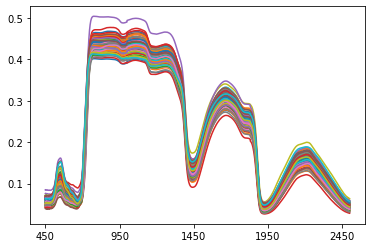

In [10]:
for i in range (0,100,1):
    spectra.iloc[i,:].plot()

# Step 1b: Obtaining Targets (Outliers removal and Normalization)

In [11]:
df = maize_tar
# ------------- Target Isolation ----------------------

#clr = ['#F4A460', '#8B7355', '#A52A2A', 'green']

def isolate_targets(df, target_names):
    T=[]
    for i in range (0,len(target_names)):
        T.append(df[target_names[i]])
    return(T)
    
T = isolate_targets(df,target_names) 


def normalize_targets(T):          
    NT =[]
    for i in range(0, len(T)):
        NT.append(min_max_normal(T[i].copy()))
    return(NT)

NT = normalize_targets(T)


# Step 1c: Spectra Preprocessing (Smooth, FOD/Contin, and Resample)

## Savgol smoothing (order 1 and order 2)

In [12]:
# -------------- Smoothed Spectra spec1 (savgol order 1) and spec2 (savgol order 2)  -----------

spec1 = {}
for i in window_lengths:
    spec1[i] = filt_sg(spectra, i, 'sg1')                   

spec2 = {}
for i in window_lengths:
    spec2[i] = filt_sg(spectra, i, 'sg2')

smth_spec = sgsmooth (spectra, 3)    

## First Order Derivative

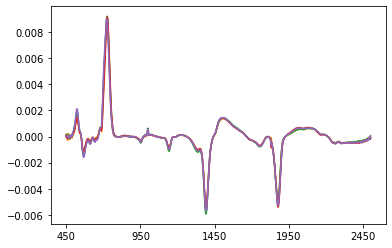

In [13]:
fod_spec = fod(smth_spec)

for i in range (0,5,1):
    fod_spec.iloc[i,:].plot()


## Continuum Removal

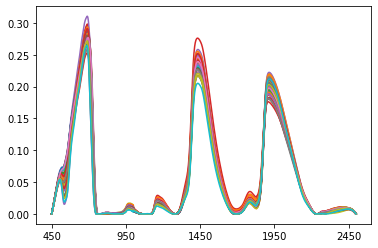

In [14]:
cr_spec = continuum_removed(spec2[51])

for i in range (0,100,1):
    cr_spec.iloc[i,:].plot()
    

In [15]:
cr_spec.iloc[:,0]

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
1205    0.0
1206    0.0
1207    0.0
1208    0.0
1209    0.0
Name: 450, Length: 1210, dtype: float64

## Resampling (n_bands)

### 1. Sampled Original (sampled_spec: sampled clipped_spectra)

In [16]:
sampled_spec = {}
for n in nbands_sampling:
    sampled_spec[n] = ad_resample_spectra (spec2[51], n)

r_val:  450    -0.239945
451    -0.246371
452    -0.249899
453    -0.252500
454    -0.256413
          ...   
2496   -0.109310
2497   -0.109632
2498   -0.109548
2499   -0.109771
2500   -0.110034
Name: 0, Length: 2051, dtype: float64
450     5.375713
451     5.457476
452     5.500254
453     5.536055
454     5.593302
          ...   
2496    3.111088
2497    3.112311
2498    3.112581
2499    3.111762
2500    3.106864
Length: 2051, dtype: float64
sum_score: 12205.78718611876 ----> n_band: 0 -----> band_score inf
r_val:  450    -0.239945
451    -0.246371
452    -0.249899
453    -0.252500
454    -0.256413
          ...   
2496   -0.109310
2497   -0.109632
2498   -0.109548
2499   -0.109771
2500   -0.110034
Name: 0, Length: 2051, dtype: float64
450     5.375713
451     5.457476
452     5.500254
453     5.536055
454     5.593302
          ...   
2496    3.111088
2497    3.112311
2498    3.112581
2499    3.111762
2500    3.106864
Length: 2051, dtype: float64
sum_score: 12205.78718611876 ----> 

cur_score: 3752.937393724889 l*band_score: 4882.314874447504 prev_score: 3746.8521650506714
current boundary at j= 306 [0, 197]
cur_score: 3758.786216451825 l*band_score: 4882.314874447504 prev_score: 3752.937393724889
current boundary at j= 307 [0, 197]
cur_score: 3764.422155993084 l*band_score: 4882.314874447504 prev_score: 3758.786216451825
current boundary at j= 308 [0, 197]
cur_score: 3769.863860967026 l*band_score: 4882.314874447504 prev_score: 3764.422155993084
current boundary at j= 309 [0, 197]
cur_score: 3775.129746051362 l*band_score: 4882.314874447504 prev_score: 3769.863860967026
current boundary at j= 310 [0, 197]
cur_score: 3780.2361463510074 l*band_score: 4882.314874447504 prev_score: 3775.129746051362
current boundary at j= 311 [0, 197]
cur_score: 3785.198332921029 l*band_score: 4882.314874447504 prev_score: 3780.2361463510074
current boundary at j= 312 [0, 197]
cur_score: 3790.0350648155477 l*band_score: 4882.314874447504 prev_score: 3785.198332921029
current boundary

current boundary at j= 540 [0, 197, 512]
cur_score: 5050.439835246124 l*band_score: 7323.472311671256 prev_score: 5044.456316821412
current boundary at j= 541 [0, 197, 512]
cur_score: 5056.4241290126665 l*band_score: 7323.472311671256 prev_score: 5050.439835246124
current boundary at j= 542 [0, 197, 512]
cur_score: 5062.416644393635 l*band_score: 7323.472311671256 prev_score: 5056.4241290126665
current boundary at j= 543 [0, 197, 512]
cur_score: 5068.41462392395 l*band_score: 7323.472311671256 prev_score: 5062.416644393635
current boundary at j= 544 [0, 197, 512]
cur_score: 5074.414590730606 l*band_score: 7323.472311671256 prev_score: 5068.41462392395
current boundary at j= 545 [0, 197, 512]
cur_score: 5080.419947241566 l*band_score: 7323.472311671256 prev_score: 5074.414590730606
current boundary at j= 546 [0, 197, 512]
cur_score: 5086.432731150161 l*band_score: 7323.472311671256 prev_score: 5080.419947241566
current boundary at j= 547 [0, 197, 512]
cur_score: 5092.450285845845 l*band

cur_score: 6720.304232841527 l*band_score: 7323.472311671256 prev_score: 6714.3330788655185
current boundary at j= 818 [0, 197, 512]
cur_score: 6726.273275812518 l*band_score: 7323.472311671256 prev_score: 6720.304232841527
current boundary at j= 819 [0, 197, 512]
cur_score: 6732.240887329205 l*band_score: 7323.472311671256 prev_score: 6726.273275812518
current boundary at j= 820 [0, 197, 512]
cur_score: 6738.207006351608 l*band_score: 7323.472311671256 prev_score: 6732.240887329205
current boundary at j= 821 [0, 197, 512]
cur_score: 6744.171381939033 l*band_score: 7323.472311671256 prev_score: 6738.207006351608
current boundary at j= 822 [0, 197, 512]
cur_score: 6750.134724197709 l*band_score: 7323.472311671256 prev_score: 6744.171381939033
current boundary at j= 823 [0, 197, 512]
cur_score: 6756.0962104255905 l*band_score: 7323.472311671256 prev_score: 6750.134724197709
current boundary at j= 824 [0, 197, 512]
cur_score: 6762.054175525404 l*band_score: 7323.472311671256 prev_score: 6

cur_score: 8103.485724051483 l*band_score: 9764.629748895008 prev_score: 8098.963271952005
current boundary at j= 1096 [0, 197, 512, 926]
cur_score: 8107.994878190624 l*band_score: 9764.629748895008 prev_score: 8103.485724051483
current boundary at j= 1097 [0, 197, 512, 926]
cur_score: 8112.490655138535 l*band_score: 9764.629748895008 prev_score: 8107.994878190624
current boundary at j= 1098 [0, 197, 512, 926]
cur_score: 8116.973022902257 l*band_score: 9764.629748895008 prev_score: 8112.490655138535
current boundary at j= 1099 [0, 197, 512, 926]
cur_score: 8121.441998482048 l*band_score: 9764.629748895008 prev_score: 8116.973022902257
current boundary at j= 1100 [0, 197, 512, 926]
cur_score: 8125.8973080465685 l*band_score: 9764.629748895008 prev_score: 8121.441998482048
current boundary at j= 1101 [0, 197, 512, 926]
cur_score: 8130.338653049665 l*band_score: 9764.629748895008 prev_score: 8125.8973080465685
current boundary at j= 1102 [0, 197, 512, 926]
cur_score: 8134.766280562555 l*b

cur_score: 9418.706113825088 l*band_score: 9764.629748895008 prev_score: 9414.244594794123
current boundary at j= 1397 [0, 197, 512, 926]
cur_score: 9423.176970769871 l*band_score: 9764.629748895008 prev_score: 9418.706113825088
current boundary at j= 1398 [0, 197, 512, 926]
cur_score: 9427.657036459528 l*band_score: 9764.629748895008 prev_score: 9423.176970769871
current boundary at j= 1399 [0, 197, 512, 926]
cur_score: 9432.146698227562 l*band_score: 9764.629748895008 prev_score: 9427.657036459528
current boundary at j= 1400 [0, 197, 512, 926]
cur_score: 9436.646017595756 l*band_score: 9764.629748895008 prev_score: 9432.146698227562
current boundary at j= 1401 [0, 197, 512, 926]
cur_score: 9441.154847097792 l*band_score: 9764.629748895008 prev_score: 9436.646017595756
current boundary at j= 1402 [0, 197, 512, 926]
cur_score: 9445.67355743269 l*band_score: 9764.629748895008 prev_score: 9441.154847097792
current boundary at j= 1403 [0, 197, 512, 926]
cur_score: 9450.202597109177 l*band

cur_score: 10663.624292034126 l*band_score: 12205.78718611876 prev_score: 10658.49877381151
current boundary at j= 1707 [0, 197, 512, 926, 1492]
cur_score: 10668.764928238294 l*band_score: 12205.78718611876 prev_score: 10663.624292034126
current boundary at j= 1708 [0, 197, 512, 926, 1492]
cur_score: 10673.920554115586 l*band_score: 12205.78718611876 prev_score: 10668.764928238294
current boundary at j= 1709 [0, 197, 512, 926, 1492]
cur_score: 10679.090913983078 l*band_score: 12205.78718611876 prev_score: 10673.920554115586
current boundary at j= 1710 [0, 197, 512, 926, 1492]
cur_score: 10684.276225454385 l*band_score: 12205.78718611876 prev_score: 10679.090913983078
current boundary at j= 1711 [0, 197, 512, 926, 1492]
cur_score: 10689.475961815706 l*band_score: 12205.78718611876 prev_score: 10684.276225454385
current boundary at j= 1712 [0, 197, 512, 926, 1492]
cur_score: 10694.688804901454 l*band_score: 12205.78718611876 prev_score: 10689.475961815706
current boundary at j= 1713 [0, 

cur_score: 12171.500637598521 l*band_score: 12205.78718611876 prev_score: 12168.35896834335
current boundary at j= 2040 [0, 197, 512, 926, 1492]
cur_score: 12174.64312878748 l*band_score: 12205.78718611876 prev_score: 12171.500637598521
current boundary at j= 2041 [0, 197, 512, 926, 1492]
cur_score: 12177.77851477964 l*band_score: 12205.78718611876 prev_score: 12174.64312878748
current boundary at j= 2042 [0, 197, 512, 926, 1492]
cur_score: 12180.903735531741 l*band_score: 12205.78718611876 prev_score: 12177.77851477964
current boundary at j= 2043 [0, 197, 512, 926, 1492]
cur_score: 12184.022137323056 l*band_score: 12205.78718611876 prev_score: 12180.903735531741
current boundary at j= 2044 [0, 197, 512, 926, 1492]
cur_score: 12187.129165483499 l*band_score: 12205.78718611876 prev_score: 12184.022137323056
current boundary at j= 2045 [0, 197, 512, 926, 1492]
cur_score: 12190.232579502583 l*band_score: 12205.78718611876 prev_score: 12187.129165483499
current boundary at j= 2046 [0, 197,

cur_score: 3817.1174318093895 l*band_score: 4882.314874447504 prev_score: 3812.7240253731493
current boundary at j= 319 [0, 110, 197, 294]
cur_score: 3821.5731280500263 l*band_score: 4882.314874447504 prev_score: 3817.1174318093895
current boundary at j= 320 [0, 110, 197, 294]
cur_score: 3826.0836617191203 l*band_score: 4882.314874447504 prev_score: 3821.5731280500263
current boundary at j= 321 [0, 110, 197, 294]
cur_score: 3830.64320869786 l*band_score: 4882.314874447504 prev_score: 3826.0836617191203
current boundary at j= 322 [0, 110, 197, 294]
cur_score: 3835.2472599935286 l*band_score: 4882.314874447504 prev_score: 3830.64320869786
current boundary at j= 323 [0, 110, 197, 294]
cur_score: 3839.89173133335 l*band_score: 4882.314874447504 prev_score: 3835.2472599935286
current boundary at j= 324 [0, 110, 197, 294]
cur_score: 3844.5707267635635 l*band_score: 4882.314874447504 prev_score: 3839.89173133335
current boundary at j= 325 [0, 110, 197, 294]
cur_score: 3849.282268990989 l*band

cur_score: 5394.873817534922 l*band_score: 6102.89359305938 prev_score: 5388.625435481307
current boundary at j= 597 [0, 110, 197, 294, 512]
cur_score: 5401.123362002492 l*band_score: 6102.89359305938 prev_score: 5394.873817534922
current boundary at j= 598 [0, 110, 197, 294, 512]
cur_score: 5407.373836636875 l*band_score: 6102.89359305938 prev_score: 5401.123362002492
current boundary at j= 599 [0, 110, 197, 294, 512]
cur_score: 5413.624851511114 l*band_score: 6102.89359305938 prev_score: 5407.373836636875
current boundary at j= 600 [0, 110, 197, 294, 512]
cur_score: 5419.8769889301475 l*band_score: 6102.89359305938 prev_score: 5413.624851511114
current boundary at j= 601 [0, 110, 197, 294, 512]
cur_score: 5426.130146778422 l*band_score: 6102.89359305938 prev_score: 5419.8769889301475
current boundary at j= 602 [0, 110, 197, 294, 512]
cur_score: 5432.384403310232 l*band_score: 6102.89359305938 prev_score: 5426.130146778422
current boundary at j= 603 [0, 110, 197, 294, 512]
cur_score: 

current boundary at j= 874 [0, 110, 197, 294, 512, 712]
cur_score: 7053.069509876306 l*band_score: 7323.472311671256 prev_score: 7047.4951918202905
current boundary at j= 875 [0, 110, 197, 294, 512, 712]
cur_score: 7058.629695549949 l*band_score: 7323.472311671256 prev_score: 7053.069509876306
current boundary at j= 876 [0, 110, 197, 294, 512, 712]
cur_score: 7064.175768986472 l*band_score: 7323.472311671256 prev_score: 7058.629695549949
current boundary at j= 877 [0, 110, 197, 294, 512, 712]
cur_score: 7069.707682035218 l*band_score: 7323.472311671256 prev_score: 7064.175768986472
current boundary at j= 878 [0, 110, 197, 294, 512, 712]
cur_score: 7075.225813450673 l*band_score: 7323.472311671256 prev_score: 7069.707682035218
current boundary at j= 879 [0, 110, 197, 294, 512, 712]
cur_score: 7080.729615152928 l*band_score: 7323.472311671256 prev_score: 7075.225813450673
current boundary at j= 880 [0, 110, 197, 294, 512, 712]
cur_score: 7086.2187903905715 l*band_score: 7323.472311671256

cur_score: 8351.366780286407 l*band_score: 8544.051030283132 prev_score: 8346.800398437781
current boundary at j= 1152 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8355.938732693696 l*band_score: 8544.051030283132 prev_score: 8351.366780286407
current boundary at j= 1153 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8360.515139285306 l*band_score: 8544.051030283132 prev_score: 8355.938732693696
current boundary at j= 1154 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8365.095951467136 l*band_score: 8544.051030283132 prev_score: 8360.515139285306
current boundary at j= 1155 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8369.680807661023 l*band_score: 8544.051030283132 prev_score: 8365.095951467136
current boundary at j= 1156 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8374.269383994695 l*band_score: 8544.051030283132 prev_score: 8369.680807661023
current boundary at j= 1157 [0, 110, 197, 294, 512, 712, 926]
cur_score: 8378.862298200063 l*band_score: 8544.051030283132 prev_score: 8374.2693

cur_score: 9689.00082642933 l*band_score: 9764.629748895008 prev_score: 9686.140650971176
current boundary at j= 1466 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9691.85716699991 l*band_score: 9764.629748895008 prev_score: 9689.00082642933
current boundary at j= 1467 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9694.711273131516 l*band_score: 9764.629748895008 prev_score: 9691.85716699991
current boundary at j= 1468 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9697.563193216305 l*band_score: 9764.629748895008 prev_score: 9694.711273131516
current boundary at j= 1469 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9700.413895064241 l*band_score: 9764.629748895008 prev_score: 9697.563193216305
current boundary at j= 1470 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9703.263518593416 l*band_score: 9764.629748895008 prev_score: 9700.413895064241
current boundary at j= 1471 [0, 110, 197, 294, 512, 712, 926, 1193]
cur_score: 9706.112166932542 l*band_score: 9764.62

cur_score: 10916.349082924835 l*band_score: 10985.208467506884 prev_score: 10911.155879788592
current boundary at j= 1755 [0, 110, 197, 294, 512, 712, 926, 1193, 1492]
cur_score: 10921.538035084553 l*band_score: 10985.208467506884 prev_score: 10916.349082924835
current boundary at j= 1756 [0, 110, 197, 294, 512, 712, 926, 1193, 1492]
cur_score: 10926.722375354828 l*band_score: 10985.208467506884 prev_score: 10921.538035084553
current boundary at j= 1757 [0, 110, 197, 294, 512, 712, 926, 1193, 1492]
cur_score: 10931.902177159807 l*band_score: 10985.208467506884 prev_score: 10926.722375354828
current boundary at j= 1758 [0, 110, 197, 294, 512, 712, 926, 1193, 1492]
cur_score: 10937.078363000914 l*band_score: 10985.208467506884 prev_score: 10931.902177159807
current boundary at j= 1759 [0, 110, 197, 294, 512, 712, 926, 1193, 1492]
cur_score: 10942.250851263161 l*band_score: 10985.208467506884 prev_score: 10937.078363000914
current boundary at j= 1760 [0, 110, 197, 294, 512, 712, 926, 1193

current boundary at j= 2040 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12174.64312878748 l*band_score: 12205.78718611876 prev_score: 12171.500637598521
current boundary at j= 2041 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12177.77851477964 l*band_score: 12205.78718611876 prev_score: 12174.64312878748
current boundary at j= 2042 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12180.903735531741 l*band_score: 12205.78718611876 prev_score: 12177.77851477964
current boundary at j= 2043 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12184.022137323056 l*band_score: 12205.78718611876 prev_score: 12180.903735531741
current boundary at j= 2044 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12187.129165483499 l*band_score: 12205.78718611876 prev_score: 12184.022137323056
current boundary at j= 2045 [0, 110, 197, 294, 512, 712, 926, 1193, 1492, 1768]
cur_score: 12190.232579502583 l*band_score: 12205.787186118

current boundary at j= 318 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3817.1174318093895 l*band_score: 4272.025515141566 prev_score: 3812.7240253731493
current boundary at j= 319 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3821.5731280500263 l*band_score: 4272.025515141566 prev_score: 3817.1174318093895
current boundary at j= 320 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3826.0836617191203 l*band_score: 4272.025515141566 prev_score: 3821.5731280500263
current boundary at j= 321 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3830.64320869786 l*band_score: 4272.025515141566 prev_score: 3826.0836617191203
current boundary at j= 322 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3835.2472599935286 l*band_score: 4272.025515141566 prev_score: 3830.64320869786
current boundary at j= 323 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3839.89173133335 l*band_score: 4272.025515141566 prev_score: 3835.2472599935286
current boundary at j= 324 [0, 75, 110, 149, 197, 258, 294]
cur_score: 3844.570726763563

cur_score: 5388.625435481307 l*band_score: 5492.604233753442 prev_score: 5382.378679176334
current boundary at j= 596 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5394.873817534922 l*band_score: 5492.604233753442 prev_score: 5388.625435481307
current boundary at j= 597 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5401.123362002492 l*band_score: 5492.604233753442 prev_score: 5394.873817534922
current boundary at j= 598 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5407.373836636875 l*band_score: 5492.604233753442 prev_score: 5401.123362002492
current boundary at j= 599 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5413.624851511114 l*band_score: 5492.604233753442 prev_score: 5407.373836636875
current boundary at j= 600 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5419.8769889301475 l*band_score: 5492.604233753442 prev_score: 5413.624851511114
current boundary at j= 601 [0, 75, 110, 149, 197, 258, 294, 408, 512]
cur_score: 5426.130146778422 l*ba

cur_score: 7041.906784033276 l*band_score: 7323.472311671256 prev_score: 7036.30441347907
current boundary at j= 873 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816]
cur_score: 7047.4951918202905 l*band_score: 7323.472311671256 prev_score: 7041.906784033276
current boundary at j= 874 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816]
cur_score: 7053.069509876306 l*band_score: 7323.472311671256 prev_score: 7047.4951918202905
current boundary at j= 875 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816]
cur_score: 7058.629695549949 l*band_score: 7323.472311671256 prev_score: 7053.069509876306
current boundary at j= 876 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816]
cur_score: 7064.175768986472 l*band_score: 7323.472311671256 prev_score: 7058.629695549949
current boundary at j= 877 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816]
cur_score: 7069.707682035218 l*band_score: 7323.472311671256 prev_score: 7064.175768986472
current boundary at j= 878 [

cur_score: 8346.800398437781 l*band_score: 8544.051030283132 prev_score: 8342.239964097103
current boundary at j= 1151 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059]
cur_score: 8351.366780286407 l*band_score: 8544.051030283132 prev_score: 8346.800398437781
current boundary at j= 1152 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059]
cur_score: 8355.938732693696 l*band_score: 8544.051030283132 prev_score: 8351.366780286407
current boundary at j= 1153 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059]
cur_score: 8360.515139285306 l*band_score: 8544.051030283132 prev_score: 8355.938732693696
current boundary at j= 1154 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059]
cur_score: 8365.095951467136 l*band_score: 8544.051030283132 prev_score: 8360.515139285306
current boundary at j= 1155 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059]
cur_score: 8369.680807661023 l*band_score: 8544.051030283132

cur_score: 9662.990724733072 l*band_score: 9764.629748895008 prev_score: 9660.044877454691
current boundary at j= 1457 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334]
cur_score: 9665.920459274243 l*band_score: 9764.629748895008 prev_score: 9662.990724733072
current boundary at j= 1458 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334]
cur_score: 9668.837603952994 l*band_score: 9764.629748895008 prev_score: 9665.920459274243
current boundary at j= 1459 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334]
cur_score: 9671.742572177282 l*band_score: 9764.629748895008 prev_score: 9668.837603952994
current boundary at j= 1460 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334]
cur_score: 9674.638986005686 l*band_score: 9764.629748895008 prev_score: 9671.742572177282
current boundary at j= 1461 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334]


current boundary at j= 1761 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334, 1492, 1645]
cur_score: 10952.585650600906 l*band_score: 10985.208467506884 prev_score: 10947.41981892343
current boundary at j= 1762 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334, 1492, 1645]
cur_score: 10957.747281019485 l*band_score: 10985.208467506884 prev_score: 10952.585650600906
current boundary at j= 1763 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334, 1492, 1645]
cur_score: 10962.903874691383 l*band_score: 10985.208467506884 prev_score: 10957.747281019485
current boundary at j= 1764 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334, 1492, 1645]
cur_score: 10968.055647348543 l*band_score: 10985.208467506884 prev_score: 10962.903874691383
current boundary at j= 1765 [0, 75, 110, 149, 197, 258, 294, 408, 512, 612, 712, 816, 926, 1059, 1193, 1334, 1492, 1645]
cur_score: 10973.203

r_val:  450    -0.239945
451    -0.246371
452    -0.249899
453    -0.252500
454    -0.256413
          ...   
2496   -0.109310
2497   -0.109632
2498   -0.109548
2499   -0.109771
2500   -0.110034
Name: 0, Length: 2051, dtype: float64
450     5.375713
451     5.457476
452     5.500254
453     5.536055
454     5.593302
          ...   
2496    3.111088
2497    3.112311
2498    3.112581
2499    3.111762
2500    3.106864
Length: 2051, dtype: float64
sum_score: 12205.78718611876 ----> n_band: 30 -----> band_score 406.8595728706253
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 5.375712727613919 l*band_score: 406.8595728706253 prev_score: 0
current boundary at j= 1 [0]
cur_score: 10.83318902904374 l*band_score: 406.8595728706253 prev_score: 5.375712727613919
current boundary at j= 2 [0]
cur_score: 16.33344285349036 l*band_score: 406.8595728706253 prev_score: 10.83318902904374
current boundary at j= 3 [0]
cur_score: 21.8694980250048 l*band_score: 406.8595728706253 prev_score: 16.

cur_score: 3794.7575596793668 l*band_score: 4068.595728706253 prev_score: 3790.0350648155477
current boundary at j= 314 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_score: 3799.376532578259 l*band_score: 4068.595728706253 prev_score: 3794.7575596793668
current boundary at j= 315 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_score: 3803.904194857319 l*band_score: 4068.595728706253 prev_score: 3799.376532578259
current boundary at j= 316 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_score: 3808.350736114919 l*band_score: 4068.595728706253 prev_score: 3803.904194857319
current boundary at j= 317 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_score: 3812.7240253731493 l*band_score: 4068.595728706253 prev_score: 3808.350736114919
current boundary at j= 318 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_score: 3817.1174318093895 l*band_score: 4068.595728706253 prev_score: 3812.7240253731493
current boundary at j= 319 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294]
cur_

current boundary at j= 591 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580]
cur_score: 5363.649603327992 l*band_score: 5696.034020188754 prev_score: 5357.411598546999
current boundary at j= 592 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580]
cur_score: 5369.890502076431 l*band_score: 5696.034020188754 prev_score: 5363.649603327992
current boundary at j= 593 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580]
cur_score: 5376.133619727337 l*band_score: 5696.034020188754 prev_score: 5369.890502076431
current boundary at j= 594 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580]
cur_score: 5382.378679176334 l*band_score: 5696.034020188754 prev_score: 5376.133619727337
current boundary at j= 595 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580]
cur_score: 5388.625435481307 l*band_score: 5696.034020188754 prev_score: 5382.378679176334
current boundary at j= 596 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 3

cur_score: 7019.415070539346 l*band_score: 7323.472311671256 prev_score: 7013.759169673844
current boundary at j= 869 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851]
cur_score: 7025.057996925139 l*band_score: 7323.472311671256 prev_score: 7019.415070539346
current boundary at j= 870 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851]
cur_score: 7030.687953778618 l*band_score: 7323.472311671256 prev_score: 7025.057996925139
current boundary at j= 871 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851]
cur_score: 7036.30441347907 l*band_score: 7323.472311671256 prev_score: 7030.687953778618
current boundary at j= 872 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851]
cur_score: 7041.906784033276 l*band_score: 7323.472311671256 prev_score: 7036.30441347907
current boundary at j= 873 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 58

cur_score: 8324.055925887362 l*band_score: 8544.051030283132 prev_score: 8319.524693879799
current boundary at j= 1146 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103]
cur_score: 8328.593020598473 l*band_score: 8544.051030283132 prev_score: 8324.055925887362
current boundary at j= 1147 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103]
cur_score: 8333.135933012058 l*band_score: 8544.051030283132 prev_score: 8328.593020598473
current boundary at j= 1148 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103]
cur_score: 8337.684999165116 l*band_score: 8544.051030283132 prev_score: 8333.135933012058
current boundary at j= 1149 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103]
cur_score: 8342.239964097103 l*band_score: 8544.051030283132 prev_score: 8337.684999165116
current boundary 

cur_score: 9618.992040787192 l*band_score: 9764.629748895008 prev_score: 9615.508909046417
current boundary at j= 1443 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383]
cur_score: 9622.416374067376 l*band_score: 9764.629748895008 prev_score: 9618.992040787192
current boundary at j= 1444 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383]
cur_score: 9625.784591395955 l*band_score: 9764.629748895008 prev_score: 9622.416374067376
current boundary at j= 1445 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383]
cur_score: 9629.09870913461 l*band_score: 9764.629748895008 prev_score: 9625.784591395955
current boundary at j= 1446 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383]
cur_score: 9632.362862015761 l*band_s

cur_score: 10864.19623281675 l*band_score: 10985.208467506884 prev_score: 10858.948726929597
current boundary at j= 1745 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689]
cur_score: 10869.437040252917 l*band_score: 10985.208467506884 prev_score: 10864.19623281675
current boundary at j= 1746 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689]
cur_score: 10874.669965020654 l*band_score: 10985.208467506884 prev_score: 10869.437040252917
current boundary at j= 1747 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689]
cur_score: 10879.896847939133 l*band_score: 10985.208467506884 prev_score: 10874.669965020654
current boundary at j= 1748 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 10

cur_score: 12152.521046212578 l*band_score: 12205.78718611876 prev_score: 12149.335805171268
current boundary at j= 2034 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689, 1768, 1848, 1937]
cur_score: 12155.69774617074 l*band_score: 12205.78718611876 prev_score: 12152.521046212578
current boundary at j= 2035 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689, 1768, 1848, 1937]
cur_score: 12158.865538165932 l*band_score: 12205.78718611876 prev_score: 12155.69774617074
current boundary at j= 2036 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294, 370, 443, 512, 580, 645, 712, 782, 851, 926, 1016, 1103, 1193, 1286, 1383, 1492, 1601, 1689, 1768, 1848, 1937]
cur_score: 12162.03890823767 l*band_score: 12205.78718611876 prev_score: 12158.865538165932
current boundary at j= 2037 [0, 59, 87, 110, 135, 164, 197, 246, 269, 294

cur_score: 3758.786216451825 l*band_score: 3966.880835488597 prev_score: 3752.937393724889
current boundary at j= 307 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294]
cur_score: 3764.422155993084 l*band_score: 3966.880835488597 prev_score: 3758.786216451825
current boundary at j= 308 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294]
cur_score: 3769.863860967026 l*band_score: 3966.880835488597 prev_score: 3764.422155993084
current boundary at j= 309 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294]
cur_score: 3775.129746051362 l*band_score: 3966.880835488597 prev_score: 3769.863860967026
current boundary at j= 310 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294]
cur_score: 3780.2361463510074 l*band_score: 3966.880835488597 prev_score: 3775.129746051362
current boundary at j= 311 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294]
cur_score: 3785.198332921029 l*band_score: 3966.880835488597 prev_score: 3780.2361463510074
current boun

cur_score: 5313.843240715427 l*band_score: 5492.604233753442 prev_score: 5307.630145664383
current boundary at j= 584 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563]
cur_score: 5320.058221237116 l*band_score: 5492.604233753442 prev_score: 5313.843240715427
current boundary at j= 585 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563]
cur_score: 5326.275761053712 l*band_score: 5492.604233753442 prev_score: 5320.058221237116
current boundary at j= 586 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563]
cur_score: 5332.495531735533 l*band_score: 5492.604233753442 prev_score: 5326.275761053712
current boundary at j= 587 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563]
cur_score: 5338.718469269299 l*band_score: 5492.604233753442 prev_score: 5332.495531735533
current boundary at j= 588 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 

cur_score: 6973.819785598636 l*band_score: 7018.327632018287 prev_score: 6968.0661155485695
current boundary at j= 861 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816]
cur_score: 6979.562162429252 l*band_score: 7018.327632018287 prev_score: 6973.819785598636
current boundary at j= 862 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816]
cur_score: 6985.292234605354 l*band_score: 7018.327632018287 prev_score: 6979.562162429252
current boundary at j= 863 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816]
cur_score: 6991.010152846202 l*band_score: 7018.327632018287 prev_score: 6985.292234605354
current boundary at j= 864 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816]
cur_score: 6996.716396111772 l*band_score: 7018.327632018287 prev_score: 6991.01015

cur_score: 8342.239964097103 l*band_score: 8544.051030283132 prev_score: 8337.684999165116
current boundary at j= 1150 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126]
cur_score: 8346.800398437781 l*band_score: 8544.051030283132 prev_score: 8342.239964097103
current boundary at j= 1151 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126]
cur_score: 8351.366780286407 l*band_score: 8544.051030283132 prev_score: 8346.800398437781
current boundary at j= 1152 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126]
cur_score: 8355.938732693696 l*band_score: 8544.051030283132 prev_score: 8351.366780286407
current boundary at j= 1153 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816,

cur_score: 9686.140650971176 l*band_score: 9764.629748895008 prev_score: 9683.275510624655
current boundary at j= 1465 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406]
cur_score: 9689.00082642933 l*band_score: 9764.629748895008 prev_score: 9686.140650971176
current boundary at j= 1466 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406]
cur_score: 9691.85716699991 l*band_score: 9764.629748895008 prev_score: 9689.00082642933
current boundary at j= 1467 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406]
cur_score: 9694.711273131516 l*band_score: 9764.629748895008 prev_score: 9691.85716699991
current boundary at j= 1468 [0, 48, 75, 93, 110, 128, 149, 172, 197, 2

cur_score: 10879.896847939133 l*band_score: 10985.208467506884 prev_score: 10874.669965020654
current boundary at j= 1748 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406, 1492, 1578, 1645, 1710]
cur_score: 10885.119247917444 l*band_score: 10985.208467506884 prev_score: 10879.896847939133
current boundary at j= 1749 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406, 1492, 1578, 1645, 1710]
cur_score: 10890.336421182285 l*band_score: 10985.208467506884 prev_score: 10885.119247917444
current boundary at j= 1750 [0, 48, 75, 93, 110, 128, 149, 172, 197, 236, 258, 274, 294, 349, 408, 461, 512, 563, 612, 661, 712, 765, 816, 868, 926, 994, 1059, 1126, 1193, 1262, 1334, 1406, 1492, 1578, 1645, 1710]
cur_score: 10895.548277658125 l*band_score: 10985.208467506884 prev_score: 1

r_val:  450    -0.239945
451    -0.246371
452    -0.249899
453    -0.252500
454    -0.256413
          ...   
2496   -0.109310
2497   -0.109632
2498   -0.109548
2499   -0.109771
2500   -0.110034
Name: 0, Length: 2051, dtype: float64
450     5.375713
451     5.457476
452     5.500254
453     5.536055
454     5.593302
          ...   
2496    3.111088
2497    3.112311
2498    3.112581
2499    3.111762
2500    3.106864
Length: 2051, dtype: float64
sum_score: 12205.78718611876 ----> n_band: 50 -----> band_score 244.11574372237519
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 5.375712727613919 l*band_score: 244.11574372237519 prev_score: 0
current boundary at j= 1 [0]
cur_score: 10.83318902904374 l*band_score: 244.11574372237519 prev_score: 5.375712727613919
current boundary at j= 2 [0]
cur_score: 16.33344285349036 l*band_score: 244.11574372237519 prev_score: 10.83318902904374
current boundary at j= 3 [0]
cur_score: 21.8694980250048 l*band_score: 244.11574372237519 prev_score

cur_score: 3677.3545573577653 l*band_score: 3905.851899558003 prev_score: 3667.5409152503785
current boundary at j= 296 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294]
cur_score: 3686.692421436916 l*band_score: 3905.851899558003 prev_score: 3677.3545573577653
current boundary at j= 297 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294]
cur_score: 3695.5699306124557 l*band_score: 3905.851899558003 prev_score: 3686.692421436916
current boundary at j= 298 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294]
cur_score: 3704.008199422376 l*band_score: 3905.851899558003 prev_score: 3695.5699306124557
current boundary at j= 299 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294]
cur_score: 3712.0315434267604 l*band_score: 3905.851899558003 prev_score: 3704.008199422376
current boundary at j= 300 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294]
cur_score: 3719.6661363841818

cur_score: 5245.6643672766 l*band_score: 5370.546361892254 prev_score: 5239.485044176742
current boundary at j= 573 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553]
cur_score: 5251.846708794339 l*band_score: 5370.546361892254 prev_score: 5245.6643672766
current boundary at j= 574 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553]
cur_score: 5258.032464930718 l*band_score: 5370.546361892254 prev_score: 5251.846708794339
current boundary at j= 575 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553]
cur_score: 5264.2214087438 l*band_score: 5370.546361892254 prev_score: 5258.032464930718
current boundary at j= 576 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553]
cur_score: 5270.412098790842 l*band_score: 5370.546361892254 prev_score: 5264.2214087438
current boundary at j= 57

cur_score: 6909.980579245258 l*band_score: 7079.35656794888 prev_score: 6904.124755553774
current boundary at j= 850 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837]
cur_score: 6915.829016808441 l*band_score: 7079.35656794888 prev_score: 6909.980579245258
current boundary at j= 851 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837]
cur_score: 6921.670188667342 l*band_score: 7079.35656794888 prev_score: 6915.829016808441
current boundary at j= 852 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837]
cur_score: 6927.503054583914 l*band_score: 7079.35656794888 prev_score: 6921.670188667342
current boundary at j= 853 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 63

current boundary at j= 1182 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140]
cur_score: 8494.660469039933 l*band_score: 8544.051030283132 prev_score: 8490.000545006695
current boundary at j= 1183 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140]
cur_score: 8499.324077043004 l*band_score: 8544.051030283132 prev_score: 8494.660469039933
current boundary at j= 1184 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140]
cur_score: 8503.991080697402 l*band_score: 8544.051030283132 prev_score: 8499.324077043004
current boundary at j= 1185 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 5

cur_score: 9834.353141859769 l*band_score: 10008.745492617383 prev_score: 9831.144756918346
current boundary at j= 1515 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140, 1193, 1248, 1305, 1363, 1419, 1492]
cur_score: 9837.575465681532 l*band_score: 10008.745492617383 prev_score: 9834.353141859769
current boundary at j= 1516 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140, 1193, 1248, 1305, 1363, 1419, 1492]
cur_score: 9840.81293519639 l*band_score: 10008.745492617383 prev_score: 9837.575465681532
current boundary at j= 1517 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140, 1193, 1248, 1305, 1363, 1419, 1492]
cur_score: 984

cur_score: 11388.006693213883 l*band_score: 11473.439954951633 prev_score: 11382.983345555811
current boundary at j= 1848 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140, 1193, 1248, 1305, 1363, 1419, 1492, 1563, 1619, 1672, 1721, 1768, 1816]
cur_score: 11393.01861152184 l*band_score: 11473.439954951633 prev_score: 11388.006693213883
current boundary at j= 1849 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 926, 980, 1034, 1085, 1140, 1193, 1248, 1305, 1363, 1419, 1492, 1563, 1619, 1672, 1721, 1768, 1816]
cur_score: 11398.019005300435 l*band_score: 11473.439954951633 prev_score: 11393.01861152184
current boundary at j= 1850 [0, 40, 66, 82, 96, 110, 125, 141, 158, 177, 197, 227, 251, 264, 277, 294, 337, 385, 429, 471, 512, 553, 593, 632, 671, 712, 754, 796, 837, 879, 9

r_val:  450    -0.239945
451    -0.246371
452    -0.249899
453    -0.252500
454    -0.256413
          ...   
2496   -0.109310
2497   -0.109632
2498   -0.109548
2499   -0.109771
2500   -0.110034
Name: 0, Length: 2051, dtype: float64
450     5.375713
451     5.457476
452     5.500254
453     5.536055
454     5.593302
          ...   
2496    3.111088
2497    3.112311
2498    3.112581
2499    3.111762
2500    3.106864
Length: 2051, dtype: float64
sum_score: 12205.78718611876 ----> n_band: 100 -----> band_score 122.05787186118759
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 5.375712727613919 l*band_score: 122.05787186118759 prev_score: 0
current boundary at j= 1 [0]
cur_score: 10.83318902904374 l*band_score: 122.05787186118759 prev_score: 5.375712727613919
current boundary at j= 2 [0]
cur_score: 16.33344285349036 l*band_score: 122.05787186118759 prev_score: 10.83318902904374
current boundary at j= 3 [0]
cur_score: 21.8694980250048 l*band_score: 122.05787186118759 prev_scor

current boundary at j= 280 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277]
cur_score: 3477.8729693817772 l*band_score: 3539.67828397444 prev_score: 3460.8719846577583
current boundary at j= 281 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277]
cur_score: 3494.4700389947625 l*band_score: 3539.67828397444 prev_score: 3477.8729693817772
current boundary at j= 282 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277]
cur_score: 3510.647251492582 l*band_score: 3539.67828397444 prev_score: 3494.4700389947625
current boundary at j= 283 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277]
cur_score: 3526.388745968067 l*band_score: 3539.67828397444 prev_score: 3

cur_score: 5147.1968421801785 l*band_score: 5248.488490031066 prev_score: 5141.073867318454
current boundary at j= 557 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553]
cur_score: 5153.324039315222 l*band_score: 5248.488490031066 prev_score: 5147.1968421801785
current boundary at j= 558 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553]
cur_score: 5159.455396182015 l*band_score: 5248.488490031066 prev_score: 5153.324039315222
current boundary at j= 559 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553]
cur_score: 5165.5905762151

cur_score: 6809.639693181518 l*band_score: 6835.2408242265055 prev_score: 6803.699718008785
current boundary at j= 833 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816]
cur_score: 6815.577453604449 l*band_score: 6835.2408242265055 prev_score: 6809.639693181518
current boundary at j= 834 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816]
cur_score: 6821.511969374214 l*band_score: 6835.2408242265055 prev_score: 6815.577453604449
current boundary at j= 835 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 

cur_score: 8401.887892412851 l*band_score: 8421.993158421943 prev_score: 8397.275434305318
current boundary at j= 1163 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140]
cur_score: 8406.50359469009 l*band_score: 8421.993158421943 prev_score: 8401.887892412851
current boundary at j= 1164 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140]
cur_score: 8411.122411742486 l*band_score: 8421.993158421943 prev_score: 8406.5

cur_score: 9370.139358849532 l*band_score: 9398.456133311445 prev_score: 9365.77072740742
current boundary at j= 1386 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140, 1167, 1193, 1219, 1248, 1277, 1305, 1334, 1363]
cur_score: 9374.513962540079 l*band_score: 9398.456133311445 prev_score: 9370.139358849532
current boundary at j= 1387 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140, 1167, 1193, 1219, 1248, 1277, 1

cur_score: 10720.951647592163 l*band_score: 10741.092723784508 prev_score: 10715.675163243668
current boundary at j= 1718 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140, 1167, 1193, 1219, 1248, 1277, 1305, 1334, 1363, 1392, 1419, 1450, 1492, 1530, 1563, 1592, 1619, 1645, 1672, 1698]
cur_score: 10726.237854089723 l*band_score: 10741.092723784508 prev_score: 10720.951647592163
current boundary at j= 1719 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953,

cur_score: 12202.680322421682 l*band_score: 12205.78718611876 prev_score: 12199.568560330916
current boundary at j= 2050 [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 712, 733, 754, 775, 796, 816, 837, 858, 879, 902, 926, 953, 980, 1007, 1034, 1059, 1085, 1112, 1140, 1167, 1193, 1219, 1248, 1277, 1305, 1334, 1363, 1392, 1419, 1450, 1492, 1530, 1563, 1592, 1619, 1645, 1672, 1698, 1721, 1744, 1768, 1792, 1816, 1840, 1865, 1891, 1918, 1947, 1978, 2013]
cur_score: 12205.787186118752 l*band_score: 12205.78718611876 prev_score: 12202.680322421682
final boundary [0, 20, 40, 55, 66, 75, 82, 89, 96, 103, 110, 117, 125, 132, 141, 149, 158, 167, 177, 187, 197, 210, 227, 243, 251, 258, 264, 271, 277, 284, 294, 311, 337, 362, 385, 408, 429, 450, 471, 492, 512, 533, 553, 573, 593, 612, 632, 651, 671, 691, 71

In [17]:
# for i in range (0,5,1):
#     sampled_spec[200].iloc[i,:].plot()

### 2. Sampled Continuum Removed  (sampled_cr)

In [18]:
sampled_cr = {}
for n in nbands_sampling:
    sampled_cr[n] = ad_resample_spectra (cr_spec, n)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 0 -----> band_score inf


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 5 -----> band_score 1524.7958479549598
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 1524.7958479549598 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 1524.7958479549598 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 1524.7958479549598 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 1524.7958479549598 prev_score: 1.0305214013190394
cur

cur_score: 3150.6472867614916 l*band_score: 4574.387543864879 prev_score: 3145.5800746115474
current boundary at j= 306 [0, 152, 294]
cur_score: 3155.091026199123 l*band_score: 4574.387543864879 prev_score: 3150.6472867614916
current boundary at j= 307 [0, 152, 294]
cur_score: 3158.956992158217 l*band_score: 4574.387543864879 prev_score: 3155.091026199123
current boundary at j= 308 [0, 152, 294]
cur_score: 3162.2145706315646 l*band_score: 4574.387543864879 prev_score: 3158.956992158217
current boundary at j= 309 [0, 152, 294]
cur_score: 3164.887981759 l*band_score: 4574.387543864879 prev_score: 3162.2145706315646
current boundary at j= 310 [0, 152, 294]
cur_score: 3166.377477908266 l*band_score: 4574.387543864879 prev_score: 3164.887981759
current boundary at j= 311 [0, 152, 294]
cur_score: 3168.257284976771 l*band_score: 4574.387543864879 prev_score: 3166.377477908266
current boundary at j= 312 [0, 152, 294]
cur_score: 3169.541074468154 l*band_score: 4574.387543864879 prev_score: 3168

cur_score: 4012.294307915377 l*band_score: 4574.387543864879 prev_score: 4009.265013465514
current boundary at j= 584 [0, 152, 294]
cur_score: 4015.330011034531 l*band_score: 4574.387543864879 prev_score: 4012.294307915377
current boundary at j= 585 [0, 152, 294]
cur_score: 4018.3951858258756 l*band_score: 4574.387543864879 prev_score: 4015.330011034531
current boundary at j= 586 [0, 152, 294]
cur_score: 4021.486063757934 l*band_score: 4574.387543864879 prev_score: 4018.3951858258756
current boundary at j= 587 [0, 152, 294]
cur_score: 4024.632214214068 l*band_score: 4574.387543864879 prev_score: 4021.486063757934
current boundary at j= 588 [0, 152, 294]
cur_score: 4027.880656106752 l*band_score: 4574.387543864879 prev_score: 4024.632214214068
current boundary at j= 589 [0, 152, 294]
cur_score: 4031.1995177245326 l*band_score: 4574.387543864879 prev_score: 4027.880656106752
current boundary at j= 590 [0, 152, 294]
cur_score: 4034.598591036896 l*band_score: 4574.387543864879 prev_score: 

current boundary at j= 861 [0, 152, 294]
cur_score: 4493.577132381505 l*band_score: 4574.387543864879 prev_score: 4491.902180497985
current boundary at j= 862 [0, 152, 294]
cur_score: 4495.325845439738 l*band_score: 4574.387543864879 prev_score: 4493.577132381505
current boundary at j= 863 [0, 152, 294]
cur_score: 4497.1404163897105 l*band_score: 4574.387543864879 prev_score: 4495.325845439738
current boundary at j= 864 [0, 152, 294]
cur_score: 4499.0058287594975 l*band_score: 4574.387543864879 prev_score: 4497.1404163897105
current boundary at j= 865 [0, 152, 294]
cur_score: 4500.931784823839 l*band_score: 4574.387543864879 prev_score: 4499.0058287594975
current boundary at j= 866 [0, 152, 294]
cur_score: 4502.9276771173545 l*band_score: 4574.387543864879 prev_score: 4500.931784823839
current boundary at j= 867 [0, 152, 294]
cur_score: 4504.9792292419825 l*band_score: 4574.387543864879 prev_score: 4502.9276771173545
current boundary at j= 868 [0, 152, 294]
cur_score: 4507.077723279277

cur_score: 5760.13851820579 l*band_score: 6099.183391819839 prev_score: 5758.757864093765
current boundary at j= 1161 [0, 152, 294, 894]
cur_score: 5761.475595670324 l*band_score: 6099.183391819839 prev_score: 5760.13851820579
current boundary at j= 1162 [0, 152, 294, 894]
cur_score: 5762.769374909536 l*band_score: 6099.183391819839 prev_score: 5761.475595670324
current boundary at j= 1163 [0, 152, 294, 894]
cur_score: 5764.020492078429 l*band_score: 6099.183391819839 prev_score: 5762.769374909536
current boundary at j= 1164 [0, 152, 294, 894]
cur_score: 5765.22927555915 l*band_score: 6099.183391819839 prev_score: 5764.020492078429
current boundary at j= 1165 [0, 152, 294, 894]
cur_score: 5766.394199075828 l*band_score: 6099.183391819839 prev_score: 5765.22927555915
current boundary at j= 1166 [0, 152, 294, 894]
cur_score: 5767.515794469594 l*band_score: 6099.183391819839 prev_score: 5766.394199075828
current boundary at j= 1167 [0, 152, 294, 894]
cur_score: 5768.597135541565 l*band_sc

cur_score: 6289.744376337933 l*band_score: 7623.979239774799 prev_score: 6286.530606778279
current boundary at j= 1472 [0, 152, 294, 894, 1398]
cur_score: 6292.955271967805 l*band_score: 7623.979239774799 prev_score: 6289.744376337933
current boundary at j= 1473 [0, 152, 294, 894, 1398]
cur_score: 6296.162612083264 l*band_score: 7623.979239774799 prev_score: 6292.955271967805
current boundary at j= 1474 [0, 152, 294, 894, 1398]
cur_score: 6299.365956229996 l*band_score: 7623.979239774799 prev_score: 6296.162612083264
current boundary at j= 1475 [0, 152, 294, 894, 1398]
cur_score: 6302.565325690856 l*band_score: 7623.979239774799 prev_score: 6299.365956229996
current boundary at j= 1476 [0, 152, 294, 894, 1398]
cur_score: 6305.759388078375 l*band_score: 7623.979239774799 prev_score: 6302.565325690856
current boundary at j= 1477 [0, 152, 294, 894, 1398]
cur_score: 6308.947603662193 l*band_score: 7623.979239774799 prev_score: 6305.759388078375
current boundary at j= 1478 [0, 152, 294, 894

current boundary at j= 1805 [0, 152, 294, 894, 1398]
cur_score: 7219.067295201073 l*band_score: 7623.979239774799 prev_score: 7216.699092570416
current boundary at j= 1806 [0, 152, 294, 894, 1398]
cur_score: 7221.400201673419 l*band_score: 7623.979239774799 prev_score: 7219.067295201073
current boundary at j= 1807 [0, 152, 294, 894, 1398]
cur_score: 7223.770722743087 l*band_score: 7623.979239774799 prev_score: 7221.400201673419
current boundary at j= 1808 [0, 152, 294, 894, 1398]
cur_score: 7226.226334597212 l*band_score: 7623.979239774799 prev_score: 7223.770722743087
current boundary at j= 1809 [0, 152, 294, 894, 1398]
cur_score: 7228.765257351277 l*band_score: 7623.979239774799 prev_score: 7226.226334597212
current boundary at j= 1810 [0, 152, 294, 894, 1398]
cur_score: 7231.414970785066 l*band_score: 7623.979239774799 prev_score: 7228.765257351277
current boundary at j= 1811 [0, 152, 294, 894, 1398]
cur_score: 7234.184474240716 l*band_score: 7623.979239774799 prev_score: 7231.41497

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 10 -----> band_score 762.3979239774799
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 762.3979239774799 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 762.3979239774799 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 762.3979239774799 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 762.3979239774799 prev_score: 1.0305214013190394
current

cur_score: 3155.091026199123 l*band_score: 3811.9896198873994 prev_score: 3150.6472867614916
current boundary at j= 307 [0, 101, 152, 249, 294]
cur_score: 3158.956992158217 l*band_score: 3811.9896198873994 prev_score: 3155.091026199123
current boundary at j= 308 [0, 101, 152, 249, 294]
cur_score: 3162.2145706315646 l*band_score: 3811.9896198873994 prev_score: 3158.956992158217
current boundary at j= 309 [0, 101, 152, 249, 294]
cur_score: 3164.887981759 l*band_score: 3811.9896198873994 prev_score: 3162.2145706315646
current boundary at j= 310 [0, 101, 152, 249, 294]
cur_score: 3166.377477908266 l*band_score: 3811.9896198873994 prev_score: 3164.887981759
current boundary at j= 311 [0, 101, 152, 249, 294]
cur_score: 3168.257284976771 l*band_score: 3811.9896198873994 prev_score: 3166.377477908266
current boundary at j= 312 [0, 101, 152, 249, 294]
cur_score: 3169.541074468154 l*band_score: 3811.9896198873994 prev_score: 3168.257284976771
current boundary at j= 313 [0, 101, 152, 249, 294]
cu

current boundary at j= 584 [0, 101, 152, 249, 294, 483]
cur_score: 4015.330011034531 l*band_score: 4574.387543864879 prev_score: 4012.294307915377
current boundary at j= 585 [0, 101, 152, 249, 294, 483]
cur_score: 4018.3951858258756 l*band_score: 4574.387543864879 prev_score: 4015.330011034531
current boundary at j= 586 [0, 101, 152, 249, 294, 483]
cur_score: 4021.486063757934 l*band_score: 4574.387543864879 prev_score: 4018.3951858258756
current boundary at j= 587 [0, 101, 152, 249, 294, 483]
cur_score: 4024.632214214068 l*band_score: 4574.387543864879 prev_score: 4021.486063757934
current boundary at j= 588 [0, 101, 152, 249, 294, 483]
cur_score: 4027.880656106752 l*band_score: 4574.387543864879 prev_score: 4024.632214214068
current boundary at j= 589 [0, 101, 152, 249, 294, 483]
cur_score: 4031.1995177245326 l*band_score: 4574.387543864879 prev_score: 4027.880656106752
current boundary at j= 590 [0, 101, 152, 249, 294, 483]
cur_score: 4034.598591036896 l*band_score: 4574.38754386487

cur_score: 4563.4527894318735 l*band_score: 4574.387543864879 prev_score: 4560.593106808911
current boundary at j= 891 [0, 101, 152, 249, 294, 483]
cur_score: 4566.336195949621 l*band_score: 4574.387543864879 prev_score: 4563.4527894318735
current boundary at j= 892 [0, 101, 152, 249, 294, 483]
cur_score: 4569.239906276493 l*band_score: 4574.387543864879 prev_score: 4566.336195949621
current boundary at j= 893 [0, 101, 152, 249, 294, 483]
cur_score: 4572.16030434736 l*band_score: 4574.387543864879 prev_score: 4569.239906276493
current boundary at j= 894 [0, 101, 152, 249, 294, 483]
cur_score: 4575.100466853087 l*band_score: 4574.387543864879 prev_score: 4572.16030434736
updated boundary
current boundary at j= 895 [0, 101, 152, 249, 294, 483, 894]
cur_score: 4578.060624272707 l*band_score: 5336.785467842359 prev_score: 4575.100466853087
current boundary at j= 896 [0, 101, 152, 249, 294, 483, 894]
cur_score: 4581.041347880544 l*band_score: 5336.785467842359 prev_score: 4578.060624272707


cur_score: 5801.209418607342 l*band_score: 6099.183391819839 prev_score: 5799.575232975667
current boundary at j= 1195 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5802.8805727389135 l*band_score: 6099.183391819839 prev_score: 5801.209418607342
current boundary at j= 1196 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5804.584608093352 l*band_score: 6099.183391819839 prev_score: 5802.8805727389135
current boundary at j= 1197 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5806.325387270983 l*band_score: 6099.183391819839 prev_score: 5804.584608093352
current boundary at j= 1198 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5808.105875279694 l*band_score: 6099.183391819839 prev_score: 5806.325387270983
current boundary at j= 1199 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5809.922895199558 l*band_score: 6099.183391819839 prev_score: 5808.105875279694
current boundary at j= 1200 [0, 101, 152, 249, 294, 483, 894, 1046]
cur_score: 5811.773883433729 l*band_score: 6

current boundary at j= 1528 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6457.660977952414 l*band_score: 6861.581315797319 prev_score: 6455.079442441439
current boundary at j= 1529 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6460.228884229552 l*band_score: 6861.581315797319 prev_score: 6457.660977952414
current boundary at j= 1530 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6462.781952233128 l*band_score: 6861.581315797319 prev_score: 6460.228884229552
current boundary at j= 1531 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6465.320438655446 l*band_score: 6861.581315797319 prev_score: 6462.781952233128
current boundary at j= 1532 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6467.844756325324 l*band_score: 6861.581315797319 prev_score: 6465.320438655446
current boundary at j= 1533 [0, 101, 152, 249, 294, 483, 894, 1046, 1398]
cur_score: 6470.354866759465 l*band_score: 6861.581315797319 prev_score: 6467.844756325324
current bo

current boundary at j= 1861 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7421.0079777349365 l*band_score: 7623.979239774799 prev_score: 7418.694072020693
current boundary at j= 1862 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7423.192027408969 l*band_score: 7623.979239774799 prev_score: 7421.0079777349365
current boundary at j= 1863 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7425.2448061274235 l*band_score: 7623.979239774799 prev_score: 7423.192027408969
current boundary at j= 1864 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7427.179929271807 l*band_score: 7623.979239774799 prev_score: 7425.2448061274235
current boundary at j= 1865 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7429.020785479337 l*band_score: 7623.979239774799 prev_score: 7427.179929271807
current boundary at j= 1866 [0, 101, 152, 249, 294, 483, 894, 1046, 1398, 1725]
cur_score: 7430.751047521804 l*band_score: 7623.979239774799 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 20 -----> band_score 381.19896198873994
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 381.19896198873994 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 381.19896198873994 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 381.19896198873994 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 381.19896198873994 prev_score: 1.0305214013190394
cu

cur_score: 3150.6472867614916 l*band_score: 3430.7906578986594 prev_score: 3145.5800746115474
current boundary at j= 306 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3155.091026199123 l*band_score: 3430.7906578986594 prev_score: 3150.6472867614916
current boundary at j= 307 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3158.956992158217 l*band_score: 3430.7906578986594 prev_score: 3155.091026199123
current boundary at j= 308 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3162.2145706315646 l*band_score: 3430.7906578986594 prev_score: 3158.956992158217
current boundary at j= 309 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3164.887981759 l*band_score: 3430.7906578986594 prev_score: 3162.2145706315646
current boundary at j= 310 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3166.377477908266 l*band_score: 3430.7906578986594 prev_score: 3164.887981759
current boundary at j= 311 [0, 77, 101, 124, 152, 186, 249, 270, 294]
cur_score: 3168.257284976771 

cur_score: 4009.265013465514 l*band_score: 4193.188581876139 prev_score: 4006.2695455364897
current boundary at j= 583 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483]
cur_score: 4012.294307915377 l*band_score: 4193.188581876139 prev_score: 4009.265013465514
current boundary at j= 584 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483]
cur_score: 4015.330011034531 l*band_score: 4193.188581876139 prev_score: 4012.294307915377
current boundary at j= 585 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483]
cur_score: 4018.3951858258756 l*band_score: 4193.188581876139 prev_score: 4015.330011034531
current boundary at j= 586 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483]
cur_score: 4021.486063757934 l*band_score: 4193.188581876139 prev_score: 4018.3951858258756
current boundary at j= 587 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483]
cur_score: 4024.632214214068 l*band_score: 4193.188581876139 prev_score: 4021.486063757934
current boundary at j= 588 [0, 77, 101, 124, 152, 1

cur_score: 4491.902180497985 l*band_score: 4574.387543864879 prev_score: 4490.290502852721
current boundary at j= 861 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694]
cur_score: 4493.577132381505 l*band_score: 4574.387543864879 prev_score: 4491.902180497985
current boundary at j= 862 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694]
cur_score: 4495.325845439738 l*band_score: 4574.387543864879 prev_score: 4493.577132381505
current boundary at j= 863 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694]
cur_score: 4497.1404163897105 l*band_score: 4574.387543864879 prev_score: 4495.325845439738
current boundary at j= 864 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694]
cur_score: 4499.0058287594975 l*band_score: 4574.387543864879 prev_score: 4497.1404163897105
current boundary at j= 865 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694]
cur_score: 4500.931784823839 l*band_score: 4574.387543864879 prev_score: 4499.0058287594975
current boundary at j= 86

cur_score: 5766.394199075828 l*band_score: 6099.183391819839 prev_score: 5765.22927555915
current boundary at j= 1166 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138]
cur_score: 5767.515794469594 l*band_score: 6099.183391819839 prev_score: 5766.394199075828
current boundary at j= 1167 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138]
cur_score: 5768.597135541565 l*band_score: 6099.183391819839 prev_score: 5767.515794469594
current boundary at j= 1168 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138]
cur_score: 5769.638808550035 l*band_score: 6099.183391819839 prev_score: 5768.597135541565
current boundary at j= 1169 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138]
cur_score: 5770.638758124659 l*band_score: 6099.183391819839 prev_score: 5769.638808550035
current boundary at j= 1170 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138]
cur_sc

cur_score: 6286.530606778279 l*band_score: 6480.382353808579 prev_score: 6283.314216829385
current boundary at j= 1471 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398]
cur_score: 6289.744376337933 l*band_score: 6480.382353808579 prev_score: 6286.530606778279
current boundary at j= 1472 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398]
cur_score: 6292.955271967805 l*band_score: 6480.382353808579 prev_score: 6289.744376337933
current boundary at j= 1473 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398]
cur_score: 6296.162612083264 l*band_score: 6480.382353808579 prev_score: 6292.955271967805
current boundary at j= 1474 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398]
cur_score: 6299.365956229996 l*band_score: 6480.382353808579 prev_score: 6296.162612083264
current boundary at j= 1475 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894

current boundary at j= 1804 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398, 1538, 1725]
cur_score: 7216.699092570416 l*band_score: 7242.780277786059 prev_score: 7214.275708113683
current boundary at j= 1805 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398, 1538, 1725]
cur_score: 7219.067295201073 l*band_score: 7242.780277786059 prev_score: 7216.699092570416
current boundary at j= 1806 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398, 1538, 1725]
cur_score: 7221.400201673419 l*band_score: 7242.780277786059 prev_score: 7219.067295201073
current boundary at j= 1807 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398, 1538, 1725]
cur_score: 7223.770722743087 l*band_score: 7242.780277786059 prev_score: 7221.400201673419
current boundary at j= 1808 [0, 77, 101, 124, 152, 186, 249, 270, 294, 393, 483, 694, 894, 978, 1046, 1138, 1398, 1538, 1725]
cur_sc

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 30 -----> band_score 254.13264132582663
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 254.13264132582663 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 254.13264132582663 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 254.13264132582663 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 254.13264132582663 prev_score: 1.0305214013190394
cu

current boundary at j= 301 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_score: 3126.075246841961 l*band_score: 3303.724337235746 prev_score: 3118.1803143046445
current boundary at j= 302 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_score: 3133.289034394395 l*band_score: 3303.724337235746 prev_score: 3126.075246841961
current boundary at j= 303 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_score: 3139.7965442452437 l*band_score: 3303.724337235746 prev_score: 3133.289034394395
current boundary at j= 304 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_score: 3145.5800746115474 l*band_score: 3303.724337235746 prev_score: 3139.7965442452437
current boundary at j= 305 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_score: 3150.6472867614916 l*band_score: 3303.724337235746 prev_score: 3145.5800746115474
current boundary at j= 306 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294]
cur_s

cur_score: 3997.5305167805795 l*band_score: 4066.122261213226 prev_score: 3994.728931955636
current boundary at j= 579 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483]
cur_score: 4000.392660745686 l*band_score: 4066.122261213226 prev_score: 3997.5305167805795
current boundary at j= 580 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483]
cur_score: 4003.3089691575146 l*band_score: 4066.122261213226 prev_score: 4000.392660745686
current boundary at j= 581 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483]
cur_score: 4006.2695455364897 l*band_score: 4066.122261213226 prev_score: 4003.3089691575146
current boundary at j= 582 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483]
cur_score: 4009.265013465514 l*band_score: 4066.122261213226 prev_score: 4006.2695455364897
current boundary at j= 583 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483]
cur_score: 4012.294

cur_score: 4484.4648534201015 l*band_score: 4574.387543864879 prev_score: 4483.170922020573
current boundary at j= 856 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737]
cur_score: 4485.844490295134 l*band_score: 4574.387543864879 prev_score: 4484.4648534201015
current boundary at j= 857 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737]
cur_score: 4487.270273011799 l*band_score: 4574.387543864879 prev_score: 4485.844490295134
current boundary at j= 858 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737]
cur_score: 4488.7430098388795 l*band_score: 4574.387543864879 prev_score: 4487.270273011799
current boundary at j= 859 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737]
cur_score: 4490.290502852721 l*band_score: 4574.387543864879 prev_score: 4488.7430098388795
current boundary at j= 860 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 2

current boundary at j= 1133 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099]
cur_score: 5707.090626243485 l*band_score: 5845.050750494012 prev_score: 5704.482537778969
current boundary at j= 1134 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099]
cur_score: 5709.651583193324 l*band_score: 5845.050750494012 prev_score: 5707.090626243485
current boundary at j= 1135 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099]
cur_score: 5712.1641136409135 l*band_score: 5845.050750494012 prev_score: 5709.651583193324
current boundary at j= 1136 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099]
cur_score: 5714.627108564066 l*band_score: 5845.050750494012 prev_score: 5712.1641136409135
current boundary at j= 1137 [0, 68, 85, 101, 116, 133, 152, 17

current boundary at j= 1466 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398]
cur_score: 6273.659373033762 l*band_score: 6353.316033145666 prev_score: 6270.441878074712
current boundary at j= 1467 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398]
cur_score: 6276.877777582557 l*band_score: 6353.316033145666 prev_score: 6273.659373033762
current boundary at j= 1468 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398]
cur_score: 6280.096360376775 l*band_score: 6353.316033145666 prev_score: 6276.877777582557
current boundary at j= 1469 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398]
cur_score: 6283.314216829385 l*band_score: 6353.316033145666 prev_score: 6280.096360376775
current boundary

cur_score: 7200.823660528256 l*band_score: 7369.846598448972 prev_score: 7197.724549404057
current boundary at j= 1799 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398, 1492, 1594, 1725, 1766]
cur_score: 7203.75966216212 l*band_score: 7369.846598448972 prev_score: 7200.823660528256
current boundary at j= 1800 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398, 1492, 1594, 1725, 1766]
cur_score: 7206.572788525281 l*band_score: 7369.846598448972 prev_score: 7203.75966216212
current boundary at j= 1801 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 483, 599, 737, 894, 956, 1000, 1046, 1099, 1218, 1398, 1492, 1594, 1725, 1766]
cur_score: 7209.255837872754 l*band_score: 7369.846598448972 prev_score: 7206.572788525281
current boundary at j= 1802 [0, 68, 85, 101, 116, 133, 152, 173, 202, 249, 263, 276, 294, 339, 421, 4

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 40 -----> band_score 190.59948099436997
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 190.59948099436997 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 190.59948099436997 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 190.59948099436997 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 190.59948099436997 prev_score: 1.0305214013190394
cu

cur_score: 3047.8563397894172 l*band_score: 3049.5916959099195 prev_score: 3036.1509985715893
current boundary at j= 294 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280]
cur_score: 3059.196976303587 l*band_score: 3049.5916959099195 prev_score: 3047.8563397894172
updated boundary
current boundary at j= 295 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294]
cur_score: 3070.1637050300237 l*band_score: 3240.1911769042895 prev_score: 3059.196976303587
current boundary at j= 296 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294]
cur_score: 3080.73470434449 l*band_score: 3240.1911769042895 prev_score: 3070.1637050300237
current boundary at j= 297 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294]
cur_score: 3090.869633303851 l*band_score: 3240.1911769042895 prev_score: 3080.73470434449
current boundary at j= 298 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 

cur_score: 3976.5993248921973 l*band_score: 4002.5891008817694 prev_score: 3974.187585553521
current boundary at j= 571 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483]
cur_score: 3979.065182055424 l*band_score: 4002.5891008817694 prev_score: 3976.5993248921973
current boundary at j= 572 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483]
cur_score: 3981.5645745319316 l*band_score: 4002.5891008817694 prev_score: 3979.065182055424
current boundary at j= 573 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483]
cur_score: 3984.1084559370224 l*band_score: 4002.5891008817694 prev_score: 3981.5645745319316
current boundary at j= 574 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483]
cur_score: 3986.7037775717995 l*band_score: 4002.5891008817694 prev_score: 3984.1084559370224
current boundary at j

cur_score: 4476.132007105356 l*band_score: 4574.387543864879 prev_score: 4475.384722314366
current boundary at j= 848 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759]
cur_score: 4476.958502778566 l*band_score: 4574.387543864879 prev_score: 4476.132007105356
current boundary at j= 849 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759]
cur_score: 4477.840768322657 l*band_score: 4574.387543864879 prev_score: 4476.958502778566
current boundary at j= 850 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759]
cur_score: 4478.7809761494855 l*band_score: 4574.387543864879 prev_score: 4477.840768322657
current boundary at j= 851 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759]
cur_score: 4479.7638287002765 l*band_score: 4574.387543864879 p

current boundary at j= 1125 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084]
cur_score: 5684.920002288452 l*band_score: 5717.984429831099 prev_score: 5681.944421263226
current boundary at j= 1126 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084]
cur_score: 5687.852330776934 l*band_score: 5717.984429831099 prev_score: 5684.920002288452
current boundary at j= 1127 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084]
cur_score: 5690.7403531544105 l*band_score: 5717.984429831099 prev_score: 5687.852330776934
current boundary at j= 1128 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084]
cur_score: 5693.58

cur_score: 6167.520253923204 l*band_score: 6289.7828728142085 prev_score: 6164.852897408541
current boundary at j= 1431 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398]
cur_score: 6170.184031144691 l*band_score: 6289.7828728142085 prev_score: 6167.520253923204
current boundary at j= 1432 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398]
cur_score: 6172.845725270487 l*band_score: 6289.7828728142085 prev_score: 6170.184031144691
current boundary at j= 1433 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398]
cur_score: 6175.505695758185 l*band_score: 6289.7828728142085 prev_score: 6172.845725270487
current boundary at j= 1434 [0, 62, 77, 89, 101

current boundary at j= 1735 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398, 1472, 1538, 1625, 1725]
cur_score: 6927.513364512396 l*band_score: 7052.180796791688 prev_score: 6921.075833052958
current boundary at j= 1736 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398, 1472, 1538, 1625, 1725]
cur_score: 6933.955886634253 l*band_score: 7052.180796791688 prev_score: 6927.513364512396
current boundary at j= 1737 [0, 62, 77, 89, 101, 112, 124, 137, 152, 167, 186, 215, 249, 260, 270, 280, 294, 329, 393, 435, 483, 580, 694, 759, 894, 945, 978, 1011, 1046, 1084, 1138, 1260, 1398, 1472, 1538, 1625, 1725]
cur_score: 6940.393359036533 l*band_score: 7052.180796791688 prev_score: 6933.955886634253
current boundary at j= 1738 [0, 62, 77, 89, 101, 112, 124, 137, 152, 1

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 50 -----> band_score 152.47958479549598
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 152.47958479549598 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 152.47958479549598 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 152.47958479549598 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 152.47958479549598 prev_score: 1.0305214013190394
cu

cur_score: 2898.381761812672 l*band_score: 2897.1121111144234 prev_score: 2882.422700816521
updated boundary
current boundary at j= 283 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282]
cur_score: 2913.9366589343495 l*band_score: 3049.5916959099195 prev_score: 2898.381761812672
current boundary at j= 284 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282]
cur_score: 2929.085472582252 l*band_score: 3049.5916959099195 prev_score: 2913.9366589343495
current boundary at j= 285 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282]
cur_score: 2943.8287411428855 l*band_score: 3049.5916959099195 prev_score: 2929.085472582252
current boundary at j= 286 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282]
cur_score: 2958.1717676369217 l*band_score: 3049.5916959099195 prev_score: 2943.8287411428855
current boundary at j= 287 [0,

cur_score: 3951.956199621327 l*band_score: 3964.4692046828955 prev_score: 3949.924009178519
current boundary at j= 560 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483]
cur_score: 3954.0115425777053 l*band_score: 3964.4692046828955 prev_score: 3951.956199621327
current boundary at j= 561 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483]
cur_score: 3956.0939434459856 l*band_score: 3964.4692046828955 prev_score: 3954.0115425777053
current boundary at j= 562 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483]
cur_score: 3958.20824802097 l*band_score: 3964.4692046828955 prev_score: 3956.0939434459856
current boundary at j= 563 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483]
cur_score: 3960.35292

cur_score: 4476.958502778566 l*band_score: 4574.387543864879 prev_score: 4476.132007105356
current boundary at j= 849 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778]
cur_score: 4477.840768322657 l*band_score: 4574.387543864879 prev_score: 4476.958502778566
current boundary at j= 850 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778]
cur_score: 4478.7809761494855 l*band_score: 4574.387543864879 prev_score: 4477.840768322657
current boundary at j= 851 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778]
cur_score: 4479.7638287002765 l*band_score: 4574.387543864879 prev_score: 4478.7809761494855
current boundary at j= 852 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 

current boundary at j= 1169 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112]
cur_score: 5770.638758124659 l*band_score: 5794.224222228847 prev_score: 5769.638808550035
current boundary at j= 1170 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112]
cur_score: 5771.595587845145 l*band_score: 5794.224222228847 prev_score: 5770.638758124659
current boundary at j= 1171 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112]
cur_score: 5772.508642457923 l*band_score: 5794.224222228847 prev_score: 5771.595587845145
current boundary at j= 1172 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152

cur_score: 6383.128658032616 l*band_score: 6404.142561410831 prev_score: 6380.176871386432
current boundary at j= 1502 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112, 1190, 1277, 1398, 1460]
cur_score: 6386.066813239435 l*band_score: 6404.142561410831 prev_score: 6383.128658032616
current boundary at j= 1503 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112, 1190, 1277, 1398, 1460]
cur_score: 6388.991548159543 l*band_score: 6404.142561410831 prev_score: 6386.066813239435
current boundary at j= 1504 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112, 1190, 1277, 1398, 1460]
cur_

cur_score: 7318.6618606806005 l*band_score: 7319.020070183808 prev_score: 7314.44899899788
current boundary at j= 1835 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112, 1190, 1277, 1398, 1460, 1509, 1571, 1660, 1725, 1749, 1789]
cur_score: 7322.932321829938 l*band_score: 7319.020070183808 prev_score: 7318.6618606806005
updated boundary
current boundary at j= 1836 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 483, 565, 614, 720, 778, 894, 937, 965, 991, 1018, 1046, 1075, 1112, 1190, 1277, 1398, 1460, 1509, 1571, 1660, 1725, 1749, 1789, 1835]
cur_score: 7327.237134660509 l*band_score: 7471.499654979303 prev_score: 7322.932321829938
current boundary at j= 1837 [0, 58, 72, 82, 91, 101, 110, 119, 129, 140, 152, 164, 178, 194, 225, 249, 258, 266, 274, 282, 294, 322, 350, 411, 444, 4

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/scipy/stats/_stats_py.py:4424: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(msg))


r_val:  450     0.000000
451     0.034652
452     0.020876
453     0.004493
454     0.013578
          ...   
2496   -0.027314
2497   -0.016046
2498   -0.007419
2499    0.005851
2500    0.000000
Name: 0, Length: 2051, dtype: float64
450     0.000000
451     0.589507
452     0.441014
453     0.252271
454     0.380969
          ...   
2496    0.445822
2497    0.302333
2498    0.175339
2499    0.144336
2500    0.000000
Length: 2051, dtype: float64
sum_score: 7623.979239774799 ----> n_band: 100 -----> band_score 76.23979239774799
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 0.0 l*band_score: 76.23979239774799 prev_score: 0
current boundary at j= 1 [0]
cur_score: 0.5895071397928052 l*band_score: 76.23979239774799 prev_score: 0.0
current boundary at j= 2 [0]
cur_score: 1.0305214013190394 l*band_score: 76.23979239774799 prev_score: 0.5895071397928052
current boundary at j= 3 [0]
cur_score: 1.2827922461941739 l*band_score: 76.23979239774799 prev_score: 1.0305214013190394
curren

cur_score: 3011.653723414157 l*band_score: 3049.5916959099195 prev_score: 2998.8533740478774
current boundary at j= 291 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288]
cur_score: 3024.084344428686 l*band_score: 3049.5916959099195 prev_score: 3011.653723414157
current boundary at j= 292 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288]
cur_score: 3036.1509985715893 l*band_score: 3049.5916959099195 prev_score: 3024.084344428686
current boundary at j= 293 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288]
cur_score: 3047.8563397894172 l*band_score: 3049.5916959099195 prev_sco

cur_score: 3923.276416135588 l*band_score: 3964.4692046828955 prev_score: 3921.8724215505076
current boundary at j= 543 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517]
cur_score: 3924.689509966993 l*band_score: 3964.4692046828955 prev_score: 3923.276416135588
current boundary at j= 544 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517]
cur_score: 3926.0914825716513 l*band_score: 3964.4692046828955 prev_score: 3924.689509966993
current boundary at j= 545 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 2

cur_score: 4457.006525406082 l*band_score: 4498.1477514671315 prev_score: 4456.2025978101765
current boundary at j= 820 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778]
cur_score: 4457.869094467315 l*band_score: 4498.1477514671315 prev_score: 4457.006525406082
current boundary at j= 821 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778]
cur_score: 4458.768357324304 l*band_score: 4498.1477514671315 prev_score: 4457.869094467315
current boundary at j= 822 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 12

cur_score: 5578.567869728375 l*band_score: 5641.744637433351 prev_score: 5574.4260361802335
current boundary at j= 1096 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 1075, 1092]
cur_score: 5582.672240490705 l*band_score: 5641.744637433351 prev_score: 5578.567869728375
current boundary at j= 1097 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 1075, 1092]
cur_score: 5586.73855814396

cur_score: 6115.42224937448 l*band_score: 6175.423184217587 prev_score: 6113.659437939122
current boundary at j= 1409 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 1075, 1092, 1112, 1138, 1190, 1240, 1277, 1335, 1398]
cur_score: 6117.252770142878 l*band_score: 6175.423184217587 prev_score: 6115.42224937448
current boundary at j= 1410 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 

cur_score: 6766.515034095383 l*band_score: 6785.341523399571 prev_score: 6763.673970263693
current boundary at j= 1705 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 1075, 1092, 1112, 1138, 1190, 1240, 1277, 1335, 1398, 1433, 1460, 1483, 1509, 1538, 1571, 1606, 1660]
cur_score: 6769.517096223788 l*band_score: 6785.341523399571 prev_score: 6766.515034095383
current boundary at j= 1706 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 

cur_score: 7615.790843235207 l*band_score: 7623.979239774799 prev_score: 7615.046816955596
current boundary at j= 2037 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462, 483, 517, 565, 592, 614, 694, 720, 745, 778, 864, 894, 918, 937, 952, 965, 978, 991, 1004, 1018, 1032, 1046, 1060, 1075, 1092, 1112, 1138, 1190, 1240, 1277, 1335, 1398, 1433, 1460, 1483, 1509, 1538, 1571, 1606, 1660, 1710, 1725, 1737, 1749, 1762, 1789, 1814, 1835, 1853, 1891, 1941]
cur_score: 7616.450707932252 l*band_score: 7623.979239774799 prev_score: 7615.790843235207
current boundary at j= 2038 [0, 41, 58, 66, 72, 77, 82, 87, 91, 96, 101, 105, 110, 114, 119, 124, 129, 135, 140, 146, 152, 158, 164, 171, 178, 186, 194, 206, 225, 242, 249, 254, 258, 262, 266, 270, 274, 278, 282, 288, 294, 301, 322, 335, 350, 393, 411, 427, 444, 462,

In [19]:
# for i in range (0,5,1):
#     sampled_cr[200].iloc[i,:].plot()

### 3. Sampled FOD  (sampled_fod)

In [20]:
sampled_fod = {}
for n in nbands_sampling:
    sampled_fod[n] = ad_resample_spectra (fod_spec, n)

r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> n_band: 0 -----> band_score inf
r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> 

current boundary at j= 293 [0, 167]
cur_score: 3041.360692003752 l*band_score: 3096.0097967672214 prev_score: 3026.015391954989
current boundary at j= 294 [0, 167]
cur_score: 3056.4038433676774 l*band_score: 3096.0097967672214 prev_score: 3041.360692003752
current boundary at j= 295 [0, 167]
cur_score: 3071.144600965019 l*band_score: 3096.0097967672214 prev_score: 3056.4038433676774
current boundary at j= 296 [0, 167]
cur_score: 3085.5823446177546 l*band_score: 3096.0097967672214 prev_score: 3071.144600965019
current boundary at j= 297 [0, 167]
cur_score: 3099.718718477591 l*band_score: 3096.0097967672214 prev_score: 3085.5823446177546
updated boundary
current boundary at j= 298 [0, 167, 297]
cur_score: 3113.5606867658917 l*band_score: 4644.014695150832 prev_score: 3099.718718477591
current boundary at j= 299 [0, 167, 297]
cur_score: 3127.1117953827793 l*band_score: 4644.014695150832 prev_score: 3113.5606867658917
current boundary at j= 300 [0, 167, 297]
cur_score: 3140.370927859014 l*

cur_score: 4376.056403941177 l*band_score: 4644.014695150832 prev_score: 4373.867176241389
current boundary at j= 571 [0, 167, 297]
cur_score: 4378.28651696314 l*band_score: 4644.014695150832 prev_score: 4376.056403941177
current boundary at j= 572 [0, 167, 297]
cur_score: 4380.769294201395 l*band_score: 4644.014695150832 prev_score: 4378.28651696314
current boundary at j= 573 [0, 167, 297]
cur_score: 4383.146483611418 l*band_score: 4644.014695150832 prev_score: 4380.769294201395
current boundary at j= 574 [0, 167, 297]
cur_score: 4385.446113989123 l*band_score: 4644.014695150832 prev_score: 4383.146483611418
current boundary at j= 575 [0, 167, 297]
cur_score: 4388.071466031573 l*band_score: 4644.014695150832 prev_score: 4385.446113989123
current boundary at j= 576 [0, 167, 297]
cur_score: 4390.76764402313 l*band_score: 4644.014695150832 prev_score: 4388.071466031573
current boundary at j= 577 [0, 167, 297]
cur_score: 4393.382196164176 l*band_score: 4644.014695150832 prev_score: 4390.7

cur_score: 4967.227401682862 l*band_score: 6192.019593534443 prev_score: 4964.698812711837
current boundary at j= 849 [0, 167, 297, 750]
cur_score: 4969.781280775395 l*band_score: 6192.019593534443 prev_score: 4967.227401682862
current boundary at j= 850 [0, 167, 297, 750]
cur_score: 4972.376105407191 l*band_score: 6192.019593534443 prev_score: 4969.781280775395
current boundary at j= 851 [0, 167, 297, 750]
cur_score: 4975.017032045684 l*band_score: 6192.019593534443 prev_score: 4972.376105407191
current boundary at j= 852 [0, 167, 297, 750]
cur_score: 4977.738588283409 l*band_score: 6192.019593534443 prev_score: 4975.017032045684
current boundary at j= 853 [0, 167, 297, 750]
cur_score: 4980.54966406725 l*band_score: 6192.019593534443 prev_score: 4977.738588283409
current boundary at j= 854 [0, 167, 297, 750]
cur_score: 4983.395797462994 l*band_score: 6192.019593534443 prev_score: 4980.54966406725
current boundary at j= 855 [0, 167, 297, 750]
cur_score: 4986.236518912183 l*band_score: 

cur_score: 5692.784720917511 l*band_score: 6192.019593534443 prev_score: 5689.365332475576
current boundary at j= 1141 [0, 167, 297, 750]
cur_score: 5696.14925540018 l*band_score: 6192.019593534443 prev_score: 5692.784720917511
current boundary at j= 1142 [0, 167, 297, 750]
cur_score: 5699.490214830108 l*band_score: 6192.019593534443 prev_score: 5696.14925540018
current boundary at j= 1143 [0, 167, 297, 750]
cur_score: 5702.784115217711 l*band_score: 6192.019593534443 prev_score: 5699.490214830108
current boundary at j= 1144 [0, 167, 297, 750]
cur_score: 5706.003939239327 l*band_score: 6192.019593534443 prev_score: 5702.784115217711
current boundary at j= 1145 [0, 167, 297, 750]
cur_score: 5709.183084575079 l*band_score: 6192.019593534443 prev_score: 5706.003939239327
current boundary at j= 1146 [0, 167, 297, 750]
cur_score: 5712.344988445156 l*band_score: 6192.019593534443 prev_score: 5709.183084575079
current boundary at j= 1147 [0, 167, 297, 750]
cur_score: 5715.474971669101 l*band_

cur_score: 6398.06136450101 l*band_score: 7740.024491918053 prev_score: 6395.663131131869
current boundary at j= 1435 [0, 167, 297, 750, 1288]
cur_score: 6400.548423939022 l*band_score: 7740.024491918053 prev_score: 6398.06136450101
current boundary at j= 1436 [0, 167, 297, 750, 1288]
cur_score: 6403.091626620942 l*band_score: 7740.024491918053 prev_score: 6400.548423939022
current boundary at j= 1437 [0, 167, 297, 750, 1288]
cur_score: 6405.679626201779 l*band_score: 7740.024491918053 prev_score: 6403.091626620942
current boundary at j= 1438 [0, 167, 297, 750, 1288]
cur_score: 6408.290809073448 l*band_score: 7740.024491918053 prev_score: 6405.679626201779
current boundary at j= 1439 [0, 167, 297, 750, 1288]
cur_score: 6410.899201497812 l*band_score: 7740.024491918053 prev_score: 6408.290809073448
current boundary at j= 1440 [0, 167, 297, 750, 1288]
cur_score: 6413.495501379804 l*band_score: 7740.024491918053 prev_score: 6410.899201497812
current boundary at j= 1441 [0, 167, 297, 750, 

cur_score: 7140.619782209092 l*band_score: 7740.024491918053 prev_score: 7135.98937935351
current boundary at j= 1737 [0, 167, 297, 750, 1288]
cur_score: 7145.4430593493735 l*band_score: 7740.024491918053 prev_score: 7140.619782209092
current boundary at j= 1738 [0, 167, 297, 750, 1288]
cur_score: 7150.4663497011115 l*band_score: 7740.024491918053 prev_score: 7145.4430593493735
current boundary at j= 1739 [0, 167, 297, 750, 1288]
cur_score: 7155.720977955921 l*band_score: 7740.024491918053 prev_score: 7150.4663497011115
current boundary at j= 1740 [0, 167, 297, 750, 1288]
cur_score: 7161.076240777547 l*band_score: 7740.024491918053 prev_score: 7155.720977955921
current boundary at j= 1741 [0, 167, 297, 750, 1288]
cur_score: 7166.3474278990025 l*band_score: 7740.024491918053 prev_score: 7161.076240777547
current boundary at j= 1742 [0, 167, 297, 750, 1288]
cur_score: 7171.55373482955 l*band_score: 7740.024491918053 prev_score: 7166.3474278990025
current boundary at j= 1743 [0, 167, 297,

current boundary at j= 2048 [0, 167, 297, 750, 1288]
cur_score: 7739.405671688147 l*band_score: 7740.024491918053 prev_score: 7738.934331066664
current boundary at j= 2049 [0, 167, 297, 750, 1288]
cur_score: 7739.715081803106 l*band_score: 7740.024491918053 prev_score: 7739.405671688147
current boundary at j= 2050 [0, 167, 297, 750, 1288]
cur_score: 7740.024491918065 l*band_score: 7740.024491918053 prev_score: 7739.715081803106
updated boundary
final boundary [0, 167, 297, 750, 1288, 2050, 2050]
i+1 is: 1
i+1 is: 2
i+1 is: 3
i+1 is: 4
i+1 is: 5
r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64


cur_score: 3041.360692003752 l*band_score: 3096.0097967672214 prev_score: 3026.015391954989
current boundary at j= 294 [0, 92, 167, 245]
cur_score: 3056.4038433676774 l*band_score: 3096.0097967672214 prev_score: 3041.360692003752
current boundary at j= 295 [0, 92, 167, 245]
cur_score: 3071.144600965019 l*band_score: 3096.0097967672214 prev_score: 3056.4038433676774
current boundary at j= 296 [0, 92, 167, 245]
cur_score: 3085.5823446177546 l*band_score: 3096.0097967672214 prev_score: 3071.144600965019
current boundary at j= 297 [0, 92, 167, 245]
cur_score: 3099.718718477591 l*band_score: 3096.0097967672214 prev_score: 3085.5823446177546
updated boundary
current boundary at j= 298 [0, 92, 167, 245, 297]
cur_score: 3113.5606867658917 l*band_score: 3870.0122459590266 prev_score: 3099.718718477591
current boundary at j= 299 [0, 92, 167, 245, 297]
cur_score: 3127.1117953827793 l*band_score: 3870.0122459590266 prev_score: 3113.5606867658917
current boundary at j= 300 [0, 92, 167, 245, 297]
cu

cur_score: 4378.28651696314 l*band_score: 4644.014695150832 prev_score: 4376.056403941177
current boundary at j= 572 [0, 92, 167, 245, 297, 403]
cur_score: 4380.769294201395 l*band_score: 4644.014695150832 prev_score: 4378.28651696314
current boundary at j= 573 [0, 92, 167, 245, 297, 403]
cur_score: 4383.146483611418 l*band_score: 4644.014695150832 prev_score: 4380.769294201395
current boundary at j= 574 [0, 92, 167, 245, 297, 403]
cur_score: 4385.446113989123 l*band_score: 4644.014695150832 prev_score: 4383.146483611418
current boundary at j= 575 [0, 92, 167, 245, 297, 403]
cur_score: 4388.071466031573 l*band_score: 4644.014695150832 prev_score: 4385.446113989123
current boundary at j= 576 [0, 92, 167, 245, 297, 403]
cur_score: 4390.76764402313 l*band_score: 4644.014695150832 prev_score: 4388.071466031573
current boundary at j= 577 [0, 92, 167, 245, 297, 403]
cur_score: 4393.382196164176 l*band_score: 4644.014695150832 prev_score: 4390.76764402313
current boundary at j= 578 [0, 92, 16

current boundary at j= 849 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4969.781280775395 l*band_score: 5418.017144342637 prev_score: 4967.227401682862
current boundary at j= 850 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4972.376105407191 l*band_score: 5418.017144342637 prev_score: 4969.781280775395
current boundary at j= 851 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4975.017032045684 l*band_score: 5418.017144342637 prev_score: 4972.376105407191
current boundary at j= 852 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4977.738588283409 l*band_score: 5418.017144342637 prev_score: 4975.017032045684
current boundary at j= 853 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4980.54966406725 l*band_score: 5418.017144342637 prev_score: 4977.738588283409
current boundary at j= 854 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4983.395797462994 l*band_score: 5418.017144342637 prev_score: 4980.54966406725
current boundary at j= 855 [0, 92, 167, 245, 297, 403, 750]
cur_score: 4986.236518912183 l*band_

cur_score: 5773.347488609731 l*band_score: 6192.019593534443 prev_score: 5771.761444081694
current boundary at j= 1173 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5774.902717742599 l*band_score: 6192.019593534443 prev_score: 5773.347488609731
current boundary at j= 1174 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5776.3971125823455 l*band_score: 6192.019593534443 prev_score: 5774.902717742599
current boundary at j= 1175 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5777.878841214369 l*band_score: 6192.019593534443 prev_score: 5776.3971125823455
current boundary at j= 1176 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5779.413928235358 l*band_score: 6192.019593534443 prev_score: 5777.878841214369
current boundary at j= 1177 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5781.103987707272 l*band_score: 6192.019593534443 prev_score: 5779.413928235358
current boundary at j= 1178 [0, 92, 167, 245, 297, 403, 750, 1068]
cur_score: 5782.921626463735 l*band_score: 6192.01

cur_score: 6448.227458985323 l*band_score: 6966.022042726248 prev_score: 6447.226739788436
current boundary at j= 1460 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6449.163146729196 l*band_score: 6966.022042726248 prev_score: 6448.227458985323
current boundary at j= 1461 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6450.0475389954845 l*band_score: 6966.022042726248 prev_score: 6449.163146729196
current boundary at j= 1462 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6450.8718601618075 l*band_score: 6966.022042726248 prev_score: 6450.0475389954845
current boundary at j= 1463 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6451.665622232554 l*band_score: 6966.022042726248 prev_score: 6450.8718601618075
current boundary at j= 1464 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6452.389863416836 l*band_score: 6966.022042726248 prev_score: 6451.665622232554
current boundary at j= 1465 [0, 92, 167, 245, 297, 403, 750, 1068, 1288]
cur_score: 6

cur_score: 7328.667683539465 l*band_score: 7740.024491918053 prev_score: 7327.314719585638
current boundary at j= 1793 [0, 92, 167, 245, 297, 403, 750, 1068, 1288, 1703]
cur_score: 7329.817042941194 l*band_score: 7740.024491918053 prev_score: 7328.667683539465
current boundary at j= 1794 [0, 92, 167, 245, 297, 403, 750, 1068, 1288, 1703]
cur_score: 7330.71672115271 l*band_score: 7740.024491918053 prev_score: 7329.817042941194
current boundary at j= 1795 [0, 92, 167, 245, 297, 403, 750, 1068, 1288, 1703]
cur_score: 7331.165866018702 l*band_score: 7740.024491918053 prev_score: 7330.71672115271
current boundary at j= 1796 [0, 92, 167, 245, 297, 403, 750, 1068, 1288, 1703]
cur_score: 7331.391706638349 l*band_score: 7740.024491918053 prev_score: 7331.165866018702
current boundary at j= 1797 [0, 92, 167, 245, 297, 403, 750, 1068, 1288, 1703]
cur_score: 7331.720791325477 l*band_score: 7740.024491918053 prev_score: 7331.391706638349
current boundary at j= 1798 [0, 92, 167, 245, 297, 403, 750, 

r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> n_band: 20 -----> band_score 387.00122459590267
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 2.2949209695028867 l*band_score: 387.00122459590267 prev_score: 0
current boundary at j= 1 [0]
cur_score: 4.909722662792406 l*band_score: 387.00122459590267 prev_score: 2.2949209695028867
current boundary at j= 2 [0]
cur_score: 8.774799943422398 l*band_score: 387.00122459590267 prev_score: 4.909722662792406
current boundary at j= 3 [0]
cur_score: 13.71103212438626 l*band_score: 387.00122459590267 prev_sc

cur_score: 3026.015391954989 l*band_score: 3096.0097967672214 prev_score: 3010.3648896416216
current boundary at j= 293 [0, 62, 92, 131, 167, 205, 245, 273]
cur_score: 3041.360692003752 l*band_score: 3096.0097967672214 prev_score: 3026.015391954989
current boundary at j= 294 [0, 62, 92, 131, 167, 205, 245, 273]
cur_score: 3056.4038433676774 l*band_score: 3096.0097967672214 prev_score: 3041.360692003752
current boundary at j= 295 [0, 62, 92, 131, 167, 205, 245, 273]
cur_score: 3071.144600965019 l*band_score: 3096.0097967672214 prev_score: 3056.4038433676774
current boundary at j= 296 [0, 62, 92, 131, 167, 205, 245, 273]
cur_score: 3085.5823446177546 l*band_score: 3096.0097967672214 prev_score: 3071.144600965019
current boundary at j= 297 [0, 62, 92, 131, 167, 205, 245, 273]
cur_score: 3099.718718477591 l*band_score: 3096.0097967672214 prev_score: 3085.5823446177546
updated boundary
current boundary at j= 298 [0, 62, 92, 131, 167, 205, 245, 273, 297]
cur_score: 3113.5606867658917 l*band_

current boundary at j= 570 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4376.056403941177 l*band_score: 4644.014695150832 prev_score: 4373.867176241389
current boundary at j= 571 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4378.28651696314 l*band_score: 4644.014695150832 prev_score: 4376.056403941177
current boundary at j= 572 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4380.769294201395 l*band_score: 4644.014695150832 prev_score: 4378.28651696314
current boundary at j= 573 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4383.146483611418 l*band_score: 4644.014695150832 prev_score: 4380.769294201395
current boundary at j= 574 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4385.446113989123 l*band_score: 4644.014695150832 prev_score: 4383.146483611418
current boundary at j= 575 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517]
cur_score: 4388.071466031573 l*band_score: 

cur_score: 4964.698812711837 l*band_score: 5031.015919746735 prev_score: 4962.127952468634
current boundary at j= 848 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750]
cur_score: 4967.227401682862 l*band_score: 5031.015919746735 prev_score: 4964.698812711837
current boundary at j= 849 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750]
cur_score: 4969.781280775395 l*band_score: 5031.015919746735 prev_score: 4967.227401682862
current boundary at j= 850 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750]
cur_score: 4972.376105407191 l*band_score: 5031.015919746735 prev_score: 4969.781280775395
current boundary at j= 851 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750]
cur_score: 4975.017032045684 l*band_score: 5031.015919746735 prev_score: 4972.376105407191
current boundary at j= 852 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750]
cur_score: 4977.738588283409 l*band_score: 5031.015919746735 prev_score: 4975.017032045684
current b

cur_score: 5735.7506206888775 l*band_score: 5805.01836893854 prev_score: 5733.154564714592
current boundary at j= 1155 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068]
cur_score: 5738.253348140087 l*band_score: 5805.01836893854 prev_score: 5735.7506206888775
current boundary at j= 1156 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068]
cur_score: 5740.7513347686645 l*band_score: 5805.01836893854 prev_score: 5738.253348140087
current boundary at j= 1157 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068]
cur_score: 5743.251443256262 l*band_score: 5805.01836893854 prev_score: 5740.7513347686645
current boundary at j= 1158 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068]
cur_score: 5745.73223798702 l*band_score: 5805.01836893854 prev_score: 5743.251443256262
current boundary at j= 1159 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068]
cur_score: 5748.197868532449 l*band_score:

current boundary at j= 1458 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288]
cur_score: 6447.226739788436 l*band_score: 6579.020818130345 prev_score: 6446.142758789829
current boundary at j= 1459 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288]
cur_score: 6448.227458985323 l*band_score: 6579.020818130345 prev_score: 6447.226739788436
current boundary at j= 1460 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288]
cur_score: 6449.163146729196 l*band_score: 6579.020818130345 prev_score: 6448.227458985323
current boundary at j= 1461 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288]
cur_score: 6450.0475389954845 l*band_score: 6579.020818130345 prev_score: 6449.163146729196
current boundary at j= 1462 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288]
cur_score: 6450.8718601618075 l*band_score: 6579.020818130345 prev_sco

cur_score: 7327.314719585638 l*band_score: 7353.023267322151 prev_score: 7325.686731071386
current boundary at j= 1792 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288, 1559, 1703]
cur_score: 7328.667683539465 l*band_score: 7353.023267322151 prev_score: 7327.314719585638
current boundary at j= 1793 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288, 1559, 1703]
cur_score: 7329.817042941194 l*band_score: 7353.023267322151 prev_score: 7328.667683539465
current boundary at j= 1794 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288, 1559, 1703]
cur_score: 7330.71672115271 l*band_score: 7353.023267322151 prev_score: 7329.817042941194
current boundary at j= 1795 [0, 62, 92, 131, 167, 205, 245, 273, 297, 335, 403, 517, 750, 871, 1068, 1189, 1288, 1559, 1703]
cur_score: 7331.165866018702 l*band_score: 7353.023267322151 prev_score: 7330.71672115271
current boundary at j= 1796 [0, 62, 92, 131, 16

r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> n_band: 30 -----> band_score 258.00081639726847
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 2.2949209695028867 l*band_score: 258.00081639726847 prev_score: 0
current boundary at j= 1 [0]
cur_score: 4.909722662792406 l*band_score: 258.00081639726847 prev_score: 2.2949209695028867
current boundary at j= 2 [0]
cur_score: 8.774799943422398 l*band_score: 258.00081639726847 prev_score: 4.909722662792406
current boundary at j= 3 [0]
cur_score: 13.71103212438626 l*band_score: 258.00081639726847 prev_sc

cur_score: 2961.7209469029126 l*band_score: 3096.009796767222 prev_score: 2945.0088570600083
current boundary at j= 289 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281]
cur_score: 2978.2006059640107 l*band_score: 3096.009796767222 prev_score: 2961.7209469029126
current boundary at j= 290 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281]
cur_score: 2994.422042444491 l*band_score: 3096.009796767222 prev_score: 2978.2006059640107
current boundary at j= 291 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281]
cur_score: 3010.3648896416216 l*band_score: 3096.009796767222 prev_score: 2994.422042444491
current boundary at j= 292 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281]
cur_score: 3026.015391954989 l*band_score: 3096.009796767222 prev_score: 3010.3648896416216
current boundary at j= 293 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281]
cur_score: 3041.360692003752 l*band_score: 3096.009796767222 prev_score: 3026.015391954989
current boundary at j= 294 [0, 5

cur_score: 4363.85753559793 l*band_score: 4386.013878753564 prev_score: 4360.97067204541
current boundary at j= 566 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452]
cur_score: 4366.488377399884 l*band_score: 4386.013878753564 prev_score: 4363.85753559793
current boundary at j= 567 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452]
cur_score: 4369.036686986621 l*band_score: 4386.013878753564 prev_score: 4366.488377399884
current boundary at j= 568 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452]
cur_score: 4371.515975643121 l*band_score: 4386.013878753564 prev_score: 4369.036686986621
current boundary at j= 569 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452]
cur_score: 4373.867176241389 l*band_score: 4386.013878753564 prev_score: 4371.515975643121
current boundary at j= 570 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452]
cur_scor

current boundary at j= 843 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822]
cur_score: 4954.490546061843 l*band_score: 5160.016327945369 prev_score: 4952.006555750583
current boundary at j= 844 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822]
cur_score: 4957.008751159299 l*band_score: 5160.016327945369 prev_score: 4954.490546061843
current boundary at j= 845 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822]
cur_score: 4959.556653500366 l*band_score: 5160.016327945369 prev_score: 4957.008751159299
current boundary at j= 846 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822]
cur_score: 4962.127952468634 l*band_score: 5160.016327945369 prev_score: 4959.556653500366
current boundary at j= 847 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822]
cur_score: 4964.69881

cur_score: 5617.363514636986 l*band_score: 5676.017960739906 prev_score: 5613.803027651056
current boundary at j= 1121 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068]
cur_score: 5620.944630917121 l*band_score: 5676.017960739906 prev_score: 5617.363514636986
current boundary at j= 1122 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068]
cur_score: 5624.542159966534 l*band_score: 5676.017960739906 prev_score: 5620.944630917121
current boundary at j= 1123 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068]
cur_score: 5628.153474391313 l*band_score: 5676.017960739906 prev_score: 5624.542159966534
current boundary at j= 1124 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068]
cur_score: 5631.852318755224 l*band_score: 5676.017960739906 prev_score: 5628.153474391313
curre

cur_score: 6367.186520496651 l*band_score: 6450.020409931712 prev_score: 6364.918611227294
current boundary at j= 1420 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288]
cur_score: 6369.3836037240535 l*band_score: 6450.020409931712 prev_score: 6367.186520496651
current boundary at j= 1421 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288]
cur_score: 6371.502356115873 l*band_score: 6450.020409931712 prev_score: 6369.3836037240535
current boundary at j= 1422 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288]
cur_score: 6373.562135696187 l*band_score: 6450.020409931712 prev_score: 6371.502356115873
current boundary at j= 1423 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288]
cur_score: 6375.561280

cur_score: 7118.670649703281 l*band_score: 7224.022859123517 prev_score: 7116.833721182687
current boundary at j= 1731 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288, 1461, 1628, 1703]
cur_score: 7121.297817404435 l*band_score: 7224.022859123517 prev_score: 7118.670649703281
current boundary at j= 1732 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288, 1461, 1628, 1703]
cur_score: 7124.431605129768 l*band_score: 7224.022859123517 prev_score: 7121.297817404435
current boundary at j= 1733 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822, 919, 1068, 1136, 1224, 1288, 1461, 1628, 1703]
cur_score: 7127.886441544652 l*band_score: 7224.022859123517 prev_score: 7124.431605129768
current boundary at j= 1734 [0, 51, 71, 92, 120, 143, 167, 193, 218, 245, 260, 281, 297, 320, 361, 403, 452, 575, 750, 822,

r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> n_band: 40 -----> band_score 193.50061229795133
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 2.2949209695028867 l*band_score: 193.50061229795133 prev_score: 0
current boundary at j= 1 [0]
cur_score: 4.909722662792406 l*band_score: 193.50061229795133 prev_score: 2.2949209695028867
current boundary at j= 2 [0]
cur_score: 8.774799943422398 l*band_score: 193.50061229795133 prev_score: 4.909722662792406
current boundary at j= 3 [0]
cur_score: 13.71103212438626 l*band_score: 193.50061229795133 prev_sc

cur_score: 2824.645879174342 l*band_score: 2902.50918446927 prev_score: 2807.59668162364
current boundary at j= 281 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273]
cur_score: 2841.855979041295 l*band_score: 2902.50918446927 prev_score: 2824.645879174342
current boundary at j= 282 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273]
cur_score: 2859.161323158292 l*band_score: 2902.50918446927 prev_score: 2841.855979041295
current boundary at j= 283 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273]
cur_score: 2876.4907956533216 l*band_score: 2902.50918446927 prev_score: 2859.161323158292
current boundary at j= 284 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273]
cur_score: 2893.7869924304937 l*band_score: 2902.50918446927 prev_score: 2876.4907956533216
current boundary at j= 285 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273]
cur_score: 2911.0023945538305 l*band_score: 2902.50918446927 pr

cur_score: 4342.562407639211 l*band_score: 4450.514082852881 prev_score: 4339.856508481671
current boundary at j= 558 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517]
cur_score: 4345.323675966781 l*band_score: 4450.514082852881 prev_score: 4342.562407639211
current boundary at j= 559 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517]
cur_score: 4347.807169393403 l*band_score: 4450.514082852881 prev_score: 4345.323675966781
current boundary at j= 560 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517]
cur_score: 4350.284519891625 l*band_score: 4450.514082852881 prev_score: 4347.807169393403
current boundary at j= 561 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517]
cur_score: 4352.782157624028 l*band_score: 4450.514082852881 prev_score: 4350.2845198916

current boundary at j= 835 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791]
cur_score: 4934.846749316566 l*band_score: 5031.015919746735 prev_score: 4932.433237898007
current boundary at j= 836 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791]
cur_score: 4937.319826235318 l*band_score: 5031.015919746735 prev_score: 4934.846749316566
current boundary at j= 837 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791]
cur_score: 4939.794481577006 l*band_score: 5031.015919746735 prev_score: 4937.319826235318
current boundary at j= 838 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791]
cur_score: 4942.279017445908 l*band_score: 5031.015919746735 prev_score: 4939.794481577006
current boundary at j= 839 [

cur_score: 5588.536676440229 l*band_score: 5611.517756640589 prev_score: 5584.897392348775
current boundary at j= 1113 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068]
cur_score: 5592.116637537629 l*band_score: 5611.517756640589 prev_score: 5588.536676440229
current boundary at j= 1114 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068]
cur_score: 5595.711143697507 l*band_score: 5611.517756640589 prev_score: 5592.116637537629
current boundary at j= 1115 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068]
cur_score: 5599.318753295485 l*band_score: 5611.517756640589 prev_score: 5595.711143697507
current boundary at j= 1116 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 4

current boundary at j= 1404 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288]
cur_score: 6326.732835828658 l*band_score: 6385.520205832394 prev_score: 6323.976201809717
current boundary at j= 1405 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288]
cur_score: 6329.526702046128 l*band_score: 6385.520205832394 prev_score: 6326.732835828658
current boundary at j= 1406 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288]
cur_score: 6332.374178517127 l*band_score: 6385.520205832394 prev_score: 6329.526702046128
current boundary at j= 1407 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 

cur_score: 7103.591099508398 l*band_score: 7159.5226550242 prev_score: 7098.940598074037
current boundary at j= 1723 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703]
cur_score: 7107.519576895455 l*band_score: 7159.5226550242 prev_score: 7103.591099508398
current boundary at j= 1724 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703]
cur_score: 7110.54420556692 l*band_score: 7159.5226550242 prev_score: 7107.519576895455
current boundary at j= 1725 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703]
cur_score: 7112.889915267854 l*band_score: 7159.5226550242 prev_score: 7110.5442055

cur_score: 7737.001599870556 l*band_score: 7740.024491918053 prev_score: 7736.217134619747
current boundary at j= 2044 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703, 1740, 1818, 1910]
cur_score: 7737.642431993202 l*band_score: 7740.024491918053 prev_score: 7737.001599870556
current boundary at j= 2045 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703, 1740, 1818, 1910]
cur_score: 7738.122423602524 l*band_score: 7740.024491918053 prev_score: 7737.642431993202
current boundary at j= 2046 [0, 45, 62, 76, 92, 115, 131, 149, 167, 187, 205, 230, 245, 255, 273, 285, 297, 313, 335, 372, 403, 437, 517, 617, 750, 791, 871, 937, 1068, 1119, 1189, 1232, 1288, 1429, 1559, 1671, 1703, 1740, 1818, 1910]
cur_score: 7738.510058

cur_score: 2663.278479275378 l*band_score: 2786.4088170904993 prev_score: 2654.1593809977826
current boundary at j= 270 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264]
cur_score: 2673.927145543043 l*band_score: 2786.4088170904993 prev_score: 2663.278479275378
current boundary at j= 271 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264]
cur_score: 2685.8298786194305 l*band_score: 2786.4088170904993 prev_score: 2673.927145543043
current boundary at j= 272 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264]
cur_score: 2698.7807693291415 l*band_score: 2786.4088170904993 prev_score: 2685.8298786194305
current boundary at j= 273 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264]
cur_score: 2712.6061086682284 l*band_score: 2786.4088170904993 prev_score: 2698.7807693291415
current boundary at j= 274 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213,

cur_score: 4317.442652536768 l*band_score: 4334.41371547411 prev_score: 4316.081911338781
current boundary at j= 547 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464]
cur_score: 4318.825349016253 l*band_score: 4334.41371547411 prev_score: 4317.442652536768
current boundary at j= 548 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464]
cur_score: 4321.2603552639575 l*band_score: 4334.41371547411 prev_score: 4318.825349016253
current boundary at j= 549 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464]
cur_score: 4323.641442726877 l*band_score: 4334.41371547411 prev_score: 4321.2603552639575
current boundary at j= 550 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429,

cur_score: 4906.494891528582 l*band_score: 4953.615674827554 prev_score: 4903.941428842548
current boundary at j= 824 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780]
cur_score: 4909.007722039713 l*band_score: 4953.615674827554 prev_score: 4906.494891528582
current boundary at j= 825 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780]
cur_score: 4911.694320769969 l*band_score: 4953.615674827554 prev_score: 4909.007722039713
current boundary at j= 826 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780]
cur_score: 4914.29950106929 l*band_score: 4953.615674827554 prev_score: 4911.694320769969
current boundary at j= 827 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234

current boundary at j= 1101 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068]
cur_score: 5545.794415531254 l*band_score: 5572.8176341809985 prev_score: 5541.635846951794
current boundary at j= 1102 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068]
cur_score: 5549.890003709271 l*band_score: 5572.8176341809985 prev_score: 5545.794415531254
current boundary at j= 1103 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068]
cur_score: 5553.929941691091 l*band_score: 5572.8176341809985 prev_score: 5549.890003709271
current boundary at j= 1104 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278

cur_score: 6395.663131131869 l*band_score: 6501.620573211165 prev_score: 6393.347085756732
current boundary at j= 1434 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068, 1108, 1151, 1217, 1237, 1288, 1411]
cur_score: 6398.06136450101 l*band_score: 6501.620573211165 prev_score: 6395.663131131869
current boundary at j= 1435 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068, 1108, 1151, 1217, 1237, 1288, 1411]
cur_score: 6400.548423939022 l*band_score: 6501.620573211165 prev_score: 6398.06136450101
current boundary at j= 1436 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068, 1108, 1151, 1217, 1237, 1288, 1411]
cur_score: 6

cur_score: 7270.942763140529 l*band_score: 7275.6230224029705 prev_score: 7266.709996874788
current boundary at j= 1767 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068, 1108, 1151, 1217, 1237, 1288, 1411, 1508, 1603, 1682, 1703, 1731]
cur_score: 7275.193326508102 l*band_score: 7275.6230224029705 prev_score: 7270.942763140529
current boundary at j= 1768 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 672, 750, 780, 843, 900, 946, 1068, 1108, 1151, 1217, 1237, 1288, 1411, 1508, 1603, 1682, 1703, 1731]
cur_score: 7279.431880515233 l*band_score: 7275.6230224029705 prev_score: 7275.193326508102
updated boundary
current boundary at j= 1769 [0, 40, 56, 68, 79, 92, 111, 125, 138, 153, 167, 183, 198, 213, 234, 245, 253, 264, 278, 287, 297, 310, 325, 348, 379, 403, 429, 464, 554, 67

r_val:  450    -0.131402
451    -0.164265
452    -0.283328
453    -0.354342
454    -0.323588
          ...   
2496    0.003199
2497   -0.005899
2498   -0.016979
2499   -0.001952
2500   -0.001952
Name: 0, Length: 2051, dtype: float64
450     2.294921
451     2.614802
452     3.865077
453     4.936232
454     4.611169
          ...   
2496    0.387635
2497    0.424273
2498    0.471341
2499    0.309410
2500    0.309410
Length: 2051, dtype: float64
sum_score: 7740.024491918053 ----> n_band: 100 -----> band_score 77.40024491918054
initial boundary [0]
current boundary at j= 0 [0]
cur_score: 2.2949209695028867 l*band_score: 77.40024491918054 prev_score: 0
current boundary at j= 1 [0]
cur_score: 4.909722662792406 l*band_score: 77.40024491918054 prev_score: 2.2949209695028867
current boundary at j= 2 [0]
cur_score: 8.774799943422398 l*band_score: 77.40024491918054 prev_score: 4.909722662792406
current boundary at j= 3 [0]
cur_score: 13.71103212438626 l*band_score: 77.40024491918054 prev_score:

cur_score: 3237.600427516551 l*band_score: 3250.8102866055824 prev_score: 3226.174278163882
current boundary at j= 309 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303]
cur_score: 3248.837479544796 l*band_score: 3250.8102866055824 prev_score: 3237.600427516551
current boundary at j= 310 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303]
cur_score: 3259.919775176852 l*band_score: 3250.8102866055824 prev_score: 3248.837479544796
updated boundary
current boundary at j= 311 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310]
cur_score: 3270.84462645

cur_score: 4409.858127113431 l*band_score: 4411.8139603932905 prev_score: 4407.6257233508395
current boundary at j= 585 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554]
cur_score: 4412.430484690493 l*band_score: 4411.8139603932905 prev_score: 4409.858127113431
updated boundary
current boundary at j= 586 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585]
cur_score: 4415.177531212781 l*band_score: 4489.214205312471 prev_score: 4412.430484690493
current boundary at j= 587 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138,

cur_score: 5029.8916520992325 l*band_score: 5031.015919746735 prev_score: 5027.0932906562
current boundary at j= 871 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843]
cur_score: 5032.680696294343 l*band_score: 5031.015919746735 prev_score: 5029.8916520992325
updated boundary
current boundary at j= 872 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871]
cur_score: 5035.452267784641 l*band_score: 5108.416164665916 prev_score: 5032.680696294343
current boundary at j= 

cur_score: 5811.233244781471 l*band_score: 5882.418613857721 prev_score: 5809.918367939047
current boundary at j= 1194 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 999, 1068, 1089, 1108, 1129, 1151, 1189]
cur_score: 5812.421745356873 l*band_score: 5882.418613857721 prev_score: 5811.233244781471
current boundary at j= 1195 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 999, 1068, 1089, 1108, 1129, 1151, 1189]
cur_score: 5

current boundary at j= 1526 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 999, 1068, 1089, 1108, 1129, 1151, 1189, 1217, 1227, 1237, 1248, 1288, 1383, 1411, 1445, 1508]
cur_score: 6529.509549808514 l*band_score: 6579.020818130346 prev_score: 6527.941496176091
current boundary at j= 1527 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 999, 1068, 1089, 1108, 1129, 1151, 1189, 1217, 1227, 1237, 1248, 1288, 1383, 1411, 1445, 1

updated boundary
current boundary at j= 1858 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 999, 1068, 1089, 1108, 1129, 1151, 1189, 1217, 1227, 1237, 1248, 1288, 1383, 1411, 1445, 1508, 1559, 1603, 1639, 1682, 1693, 1703, 1713, 1731, 1748, 1768, 1818, 1857]
cur_score: 7440.120653562123 l*band_score: 7507.823757160512 prev_score: 7434.324395742566
current boundary at j= 1859 [0, 23, 40, 49, 56, 62, 68, 73, 79, 85, 92, 100, 111, 118, 125, 131, 138, 145, 153, 160, 167, 175, 183, 191, 198, 205, 213, 221, 234, 241, 245, 249, 253, 258, 264, 273, 278, 283, 287, 292, 297, 303, 310, 317, 325, 335, 348, 366, 379, 391, 403, 416, 429, 445, 464, 517, 554, 585, 672, 705, 750, 763, 780, 803, 843, 871, 900, 927, 946, 9

In [21]:
# for i in range (0,10,1):
#     sampled_fod[200].iloc[i,:].plot()

In [22]:
cr_spec.shape

(1210, 2051)

## Visualizing Processed Spectrum (variable samples)

In [23]:


def plot_spec (sample, process):
    x1 = spec2[51].iloc[sample,:]
    x1.plot()
    if process == 'continuum':
        x2 = cr_spec.iloc[sample,:]
        x2.plot()
    else: 
        x3 = fod_spec.iloc[sample,:]*100
        
        x3.plot()
    plt.ylim([-0.6, 0.8])

ipywidgets.interact(plot_spec, sample = (0, 293,1), process = ['fod', 'continuum'])

interactive(children=(IntSlider(value=146, description='sample', max=293), Dropdown(description='process', opt…

<function __main__.plot_spec(sample, process)>

## Correlation between wavelengths and Targets

In [24]:
plt.style.use(['science','notebook','grid'])

def plot_corr (target, spec_cr_fod, n_bands):
    
    i = target_names.index(target)    
    
    if  spec_cr_fod == 'spec':
        r_val, p_val = find_rpval (resample_spectra(spec2[51], n_bands), T[i])
        r_val.iloc[0,:].plot(color = clr[i])
    elif  spec_cr_fod == 'cr':
        r_cr, p_cr = find_rpval (resample_spectra(cr_spec, n_bands), T[i])
        r_cr.iloc[0,:].plot(color = clr[i])
    else:
        r_fod, p_fod = find_rpval (resample_spectra(fod_spec, n_bands), T[i])
        r_fod.iloc[0,:].plot(color = clr[i])
    
    plt.ylim([-0.9, 0.9])

ipywidgets.interact(plot_corr, target = target_names, spec_cr_fod = ['spec', 'cr','fod'], n_bands = nbands_sampling)



interactive(children=(Dropdown(description='target', options=('Nitrogen', 'Phosphorus', 'Potassium'), value='N…

<function __main__.plot_corr(target, spec_cr_fod, n_bands)>

# Step 2:  Parameters for Best Train-Test Split  

In [25]:
# Building Mtree (Model Tree) ----------------------------------

tst_siz = 0.20

rand_t = [None] * (len(T))
err_t = [None] * (len(T))

print('Without Normalization:')
for i in range (0,len(T)):
    rand_t[i], err_t[i] = best_split(spectra.copy(), T[i], tst_siz) 
    print ('For '+ target_names[i]+ ' :test size =', tst_siz, '\t min bin error=', err_t[i], '\t at randome state =', rand_t[i])
    
rand_nt = [None] * (len(T))
err_nt = [None] * (len(T))

print('After Normalization:')
for i in range (0,len(T)):
    rand_nt[i], err_nt[i] = best_split(spectra.copy(), NT[i], tst_siz)     
    print ('For '+ target_names[i]+ ' :test size =', tst_siz, '\t min bin error=', err_nt[i], '\t at randome state =', rand_nt[i])
    
    

Without Normalization:
For Nitrogen :test size = 0.2 	 min bin error= 50.0 	 at randome state = 1
For Phosphorus :test size = 0.2 	 min bin error= 35.0 	 at randome state = 39
For Potassium :test size = 0.2 	 min bin error= 60.0 	 at randome state = 16
After Normalization:
For Nitrogen :test size = 0.2 	 min bin error= 50.0 	 at randome state = 1
For Phosphorus :test size = 0.2 	 min bin error= 80.0 	 at randome state = 18
For Potassium :test size = 0.2 	 min bin error= 62.5 	 at randome state = 29


# Step 3: Parameters for Best Model Fit 

## PLSR

In [26]:
from sklearn import linear_model

def best_param_PLSR (X_train, X_test, y_train, y_test, n_comp):
        
    iqrpL = []
#     r2L = []
#     rpdL = []
    
    for n in range(1,n_comp):
        Model = PLSRegression(n_components=n, scale=True)
        Model.fit(X_train, y_train)
        y_pred = Model.predict(X_test, copy=True)
        
        iqrp_test = find_iqrp(y_pred, y_test)
#         r2_test = find_r2(y_pred, y_test)         
#         rpd_test = find_rpd(y_pred, y_test)
               
        iqrpL.append(iqrp_test)
#         r2L.append(r2_test)
#         rpdL.append(rpd_test)
                
    
    IQRP = max(iqrpL)
    n_iqrp = iqrpL.index(max(iqrpL))+1
#     R2 = max(r2L)     
#     n_r2 = r2L.index(R2)+1    
#     RPD = max(rpdL)
#     n_rpd = rpdL.index(RPD)+1
    
    #print('IQRP :', IQRP,  'R2 :', R2,  '>>> n_comp: ', n_iqrp)    
    return (n_iqrp)
        
 

# Step 4: Building Model Tree (Mtree)

In [27]:
import os
os.system('say "your Meta Tree building has started"')
import time

In [28]:
# 0. Available machine learning regression models --------------------------------- (7)
ml_methods = ['mult', 'plsr', 'randomforest', 'svr', 'ridge', 'gbrt']
#ml_methods = ['mult', 'plsr', 'cubist', 'randomforest', 'ridge' 'gbrt', 'svr']

In [29]:
max_n_comp = 5

def build_tree_for (method_name):
    tree ={}
    start = time.time()
    m = method_name
    #-- code to build tree----
    for t in target_names:
        print('tree for: '+ m +' ------> running on: ' + t)
        tree[t] ={}
        for tp in prepare_target:
            tree[t][tp] ={}
            for n in nbands_sampling:
                tree[t][tp][n] ={}
                for p in prepare_spec:
                    tree[t][tp][n][p] ={}
                    Y = tree[t][tp][n][p]
                    
                        
                    #------ setting spec to appropriate (sampled) spectra----
                    if p == 'none':
                        if n == 0:
                            if m == 'randomforest' or m == 'cubist' or m == 'gbrt':
                                #---- reched here due to tree based methods e.g. randomforest--
                                spec = sampled_spec[100]
                            else:
                                spec = spec2[51]
                        else:
                            #---- reached here with some n!=0----
                            spec = sampled_spec[n]
                        
                    elif p == 'fod':
                        if n == 0:
                            if m == 'randomforest' or m == 'cubist' or m == 'gbrt':
                                #---- reched here due to tree based methods e.g. randomforest--
                                spec = sampled_fod[100]
                            else:
                                spec = fod_spec
                        else:
                            #---- reached here with some n!=0----
                            spec = sampled_fod[n]
                                
                    else:  
                        if n == 0:
                            if m == 'randomforest' or m == 'cubist' or m == 'gbrt':
                                #---- reched here due to tree based methods e.g. randomforest--
                                spec = sampled_cr[100]
                            else:
                                spec = cr_spec
                        else:
                            #---- reached here with some n!=0----
                            spec = sampled_cr[n]
                        
                    #---- target selection and normalization ---
                    if tp == 'none':
                        y = T[target_names.index(t)]
                        rand_n = rand_t[target_names.index(t)]  #-- for future use in train-test split
                    else:
                        y = NT[target_names.index(t)]
                        rand_n = rand_nt[target_names.index(t)] #-- for future use in train-test split
                        #print('one more target set')
                            
                    #---- performing train-test split----------------------
                    X_train, X_test, y_train, y_test = train_test_split(spec, y, test_size= tst_siz, random_state=rand_n)
                        
                        
                    #------INITIATING the appropriate models-----------------------------------------------
                    #----- PLSR: best parameters, fitting, and prediction
                    if m == 'plsr':
                        n_com = best_param_PLSR (X_train, X_test, y_train, y_test, max_n_comp)
                        Y['n_comp'] = n_com
                        Model = PLSRegression(n_components=n_com, scale=True)
                    #----- MULTILINEAR:  fitting, and prediction---------- 
                    elif m == 'mult':
                        Model = linear_model.LinearRegression()    
                    #----- RANDOM_FOREST:   fitting, and prediction---------- 
                    elif m == 'randomforest': 
                        Model = RandomForestRegressor(random_state= 23)    
                    #----- CUBIST REGRESSION:    fitting and prediction---------
                    elif m == 'cubist':
                        Model = Cubist(n_rules = 50, n_committees = 5, random_state = 42)    
                    #------ SUPPORT VECTOR MACHINE FOR REGRESSION: fitting and prediction-----------      
                    elif m == 'svr': 
                        Model = SVR()
                    #------ RIDGE REGRESSION: fitting and prediction-----------      
                    elif m == 'ridge': 
                        Model = KernelRidge()
                    #------ GRADIENT BOOSTING REGRESSION: fitting and prediction-----------      
                    else: 
                        Model = GradientBoostingRegressor()                         
                        
                    Model.fit(X_train, y_train)
                    y_pred = Model.predict(X_test)
                    yhat_pred = Model.predict(X_train)
                                
                    Y['test'] = y_test
                    Y['testP'] = y_pred
                    Y['train'] = y_train
                    Y['trainP'] = yhat_pred
                    Y['iqrp_test'] = find_iqrp(y_pred, y_test)
                    Y['r2_test'] = find_r2(y_pred, y_test)
                    Y['rpd_test'] = find_rpd(y_pred, y_test)
                    Y['rmse_test'] = find_rmse(y_pred, y_test)
                                                                
                                                                         
    end = time.time()                            
    os.system('say "your Meta tree built for one more method"')                            

    print('End time - Start time =', (end-start)) 
    
    return (tree.copy())


## Loading the saved Mtree

In [30]:
# with open ('maize.pickle', 'rb') as file:
#     Mtree = pickle.load(file)

## Mtree initialisation (do not run below code every time)

In [31]:
Mtree ={}

## Creating different branches of Mtree (for separate methods)

### PLSR Branch 

In [32]:
Mtree['plsr'] = build_tree_for ('plsr')

tree for: plsr ------> running on: Nitrogen
tree for: plsr ------> running on: Phosphorus
tree for: plsr ------> running on: Potassium
End time - Start time = 7.214656114578247


### Multiple Linear Regression Branch

In [33]:
Mtree['mult'] = build_tree_for ('mult')

tree for: mult ------> running on: Nitrogen
tree for: mult ------> running on: Phosphorus
tree for: mult ------> running on: Potassium
End time - Start time = 37.01131200790405



### Random Forest Branch

In [34]:
Mtree['randomforest'] = build_tree_for ('randomforest')

tree for: randomforest ------> running on: Nitrogen
tree for: randomforest ------> running on: Phosphorus
tree for: randomforest ------> running on: Potassium
End time - Start time = 264.6772129535675


### SVM Branch

In [35]:
Mtree['svr'] = build_tree_for ('svr')

tree for: svr ------> running on: Nitrogen
tree for: svr ------> running on: Phosphorus
tree for: svr ------> running on: Potassium
End time - Start time = 55.41971397399902


### GBRT Branch

In [36]:
Mtree['gbrt'] = build_tree_for ('gbrt')

tree for: gbrt ------> running on: Nitrogen
tree for: gbrt ------> running on: Phosphorus
tree for: gbrt ------> running on: Potassium
End time - Start time = 141.90759086608887


### Ridge Regression Branch

In [37]:
Mtree['ridge'] = build_tree_for ('ridge')

tree for: ridge ------> running on: Nitrogen
tree for: ridge ------> running on: Phosphorus
tree for: ridge ------> running on: Potassium
End time - Start time = 66.07263803482056


### Cubist Branch

## Best of all worlds

In [38]:
ml_methods = ['mult', 'plsr', 'randomforest','svr', 'ridge', 'gbrt']

In [39]:
def best_model_parameters (Mtree, target, method, scorer):
    t=target
    m= method
    
    best_score = -1
    best_n_comp = 'NA'
    
    
    for tp in prepare_target:
        for n in nbands_sampling:
            for p in prepare_spec:
                Y = Mtree[m][t][tp][n][p]
                    
                if scorer == 'iqrp':
                    cur_score = Y['iqrp_test']
                elif scorer == 'rpd':
                    cur_score = Y['rpd_test']
                else:
                    cur_score = Y['r2_test']  
                    
                if cur_score > best_score:
                    best_score = cur_score
                    best_tp = tp
                    best_n = n
                    best_p = p
                    if m == 'plsr':
                        best_n_comp = Y['n_comp']
                            
    param_list = [scorer, np.round(best_score,2), 'Spec:', best_p, 'bands:', best_n, 'Tar:', best_tp]                                 
    return (param_list)                                
    

In [40]:
def best_score_for (Mtree, target, scorer):
    
    for method in ml_methods:
        param_list= best_model_parameters (Mtree, target, method, scorer)
        print('For:'+target+'->', param_list, ':'+method)
     
    return

In [41]:
best_score_for(Mtree, 'Nitrogen', 'iqrp')

For:Nitrogen-> ['iqrp', 3.65, 'Spec:', 'none', 'bands:', 30, 'Tar:', 'none'] :mult
For:Nitrogen-> ['iqrp', 3.14, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'minmax'] :plsr
For:Nitrogen-> ['iqrp', 3.1, 'Spec:', 'fod', 'bands:', 50, 'Tar:', 'minmax'] :randomforest
For:Nitrogen-> ['iqrp', 2.85, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Nitrogen-> ['iqrp', 2.83, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'minmax'] :ridge
For:Nitrogen-> ['iqrp', 3.25, 'Spec:', 'fod', 'bands:', 50, 'Tar:', 'minmax'] :gbrt


In [42]:
best_score_for(Mtree, 'Nitrogen', 'r2')

For:Nitrogen-> ['r2', 0.82, 'Spec:', 'none', 'bands:', 30, 'Tar:', 'none'] :mult
For:Nitrogen-> ['r2', 0.75, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :plsr
For:Nitrogen-> ['r2', 0.75, 'Spec:', 'fod', 'bands:', 50, 'Tar:', 'minmax'] :randomforest
For:Nitrogen-> ['r2', 0.7, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Nitrogen-> ['r2', 0.7, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'minmax'] :ridge
For:Nitrogen-> ['r2', 0.77, 'Spec:', 'fod', 'bands:', 50, 'Tar:', 'minmax'] :gbrt


In [43]:
best_score_for(Mtree, 'Phosphorus', 'iqrp')

For:Phosphorus-> ['iqrp', 1.69, 'Spec:', 'none', 'bands:', 50, 'Tar:', 'minmax'] :mult
For:Phosphorus-> ['iqrp', 1.41, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :plsr
For:Phosphorus-> ['iqrp', 1.48, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :randomforest
For:Phosphorus-> ['iqrp', 1.27, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Phosphorus-> ['iqrp', 1.26, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'minmax'] :ridge
For:Phosphorus-> ['iqrp', 1.47, 'Spec:', 'fod', 'bands:', 100, 'Tar:', 'none'] :gbrt


In [44]:
best_score_for(Mtree, 'Phosphorus', 'r2')

For:Phosphorus-> ['r2', 0.53, 'Spec:', 'none', 'bands:', 50, 'Tar:', 'minmax'] :mult
For:Phosphorus-> ['r2', 0.33, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :plsr
For:Phosphorus-> ['r2', 0.39, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :randomforest
For:Phosphorus-> ['r2', 0.18, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Phosphorus-> ['r2', 0.15, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'minmax'] :ridge
For:Phosphorus-> ['r2', 0.39, 'Spec:', 'fod', 'bands:', 100, 'Tar:', 'none'] :gbrt


In [45]:
best_score_for(Mtree, 'Potassium', 'iqrp')

For:Potassium-> ['iqrp', 2.1, 'Spec:', 'none', 'bands:', 100, 'Tar:', 'none'] :mult
For:Potassium-> ['iqrp', 1.68, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :plsr
For:Potassium-> ['iqrp', 1.65, 'Spec:', 'continuum', 'bands:', 0, 'Tar:', 'none'] :randomforest
For:Potassium-> ['iqrp', 1.41, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Potassium-> ['iqrp', 1.41, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'none'] :ridge
For:Potassium-> ['iqrp', 1.73, 'Spec:', 'continuum', 'bands:', 100, 'Tar:', 'none'] :gbrt


In [46]:
best_score_for(Mtree, 'Potassium', 'r2')

For:Potassium-> ['r2', 0.64, 'Spec:', 'none', 'bands:', 100, 'Tar:', 'none'] :mult
For:Potassium-> ['r2', 0.44, 'Spec:', 'continuum', 'bands:', 0, 'Tar:', 'minmax'] :plsr
For:Potassium-> ['r2', 0.42, 'Spec:', 'continuum', 'bands:', 0, 'Tar:', 'none'] :randomforest
For:Potassium-> ['r2', 0.2, 'Spec:', 'fod', 'bands:', 0, 'Tar:', 'none'] :svr
For:Potassium-> ['r2', 0.2, 'Spec:', 'none', 'bands:', 0, 'Tar:', 'none'] :ridge
For:Potassium-> ['r2', 0.47, 'Spec:', 'continuum', 'bands:', 100, 'Tar:', 'none'] :gbrt


## Plotting Model Accuracy (ipywidgets)

In [47]:
def plot_model_acc (target, target_preprocessing, spec_preprocessing, n_bands, method):
    
    m = method
    t = target
    
    i = target_names.index(target)
    
    
    p = spec_preprocessing
    n = n_bands
    tp = target_preprocessing
    
    Y = Mtree[m][t][tp][n][p]
    
    y_test = Y['test']
    y_pred = Y['testP']
    y_train = Y['train']
    yhat_pred = Y['trainP']
    
    if m == 'plsr':
        n_com = Y['n_comp']
        y_pred = y_pred[:,0]
        yhat_pred = yhat_pred[:,0]
    
    
    iqrp_test = Y['iqrp_test']
    r2_test = Y['r2_test']
    rpd_test = Y['rpd_test']
    
    iqrp_train = find_iqrp(yhat_pred, y_train)
    r2_train = find_r2(yhat_pred, y_train)
    rpd_train = find_rpd(yhat_pred, y_train)
    
    y_tp = pd.DataFrame({'actual':y_test.values, 'predic': y_pred})
    z = np.polyfit(y_test, y_pred, 1)
    
    yhat_tp = pd.DataFrame({'actual':y_train.values, 'predic': yhat_pred})
    zhat = np.polyfit(y_train, yhat_pred, 1)
    
    fig, axes = plt.subplots(1,2, figsize=(18,8))
    
    #with plt.style.context(('ggplot')): ---- PLOT of test-prediction --------------------------------------
    y_tp.plot.scatter(ax= axes[0], x="actual", y="predic", alpha=0.8, color = clr[i], edgecolors='k')
    axes[0].plot(y_test, np.polyval(z, y_test),  c='blue', linewidth=1)
    axes[0].plot(y_test, y_test, color='green', linewidth=1)
    axes[0].tick_params(axis='both', labelsize=10)
    axes[0].text(0.05, 0.95, target_names[i]+' (Test Data)', transform=axes[0].transAxes, fontsize = 20, color = clr[i])
    axes[0].text(0.05, 0.90, 'IQRP ={:.2f}'.format(iqrp_test), transform=axes[0].transAxes, fontsize = 16)
    axes[0].text(0.05, 0.85, 'RPD ={:.2f}'.format(rpd_test), transform=axes[0].transAxes, fontsize = 16)
    axes[0].text(0.05, 0.80, 'R2 ={:.2f}'.format(np.round(r2_test,3)), transform=axes[0].transAxes, fontsize = 16)
    axes[0].text(0.95, 0.15, 'Method: '+method, transform=axes[0].transAxes, 
                    horizontalalignment='right', fontsize = 20)
    
    if method == 'plsr':
        axes[0].text(0.95, 0.05, 'n_component={:.2f}'.format(n_com), transform=axes[0].transAxes, 
                    horizontalalignment='right', fontsize = 12)
    
    #---------------------------------- ---- PLOT of train-prediction --------------------------------------
    yhat_tp.plot.scatter(ax= axes[1], x="actual", y="predic", alpha=0.8, color = clr[i], edgecolors='k')
    axes[1].plot(y_train, np.polyval(zhat, y_train),  c='blue', linewidth=1)
    axes[1].plot(y_train, y_train, color='green', linewidth=1)
    axes[1].tick_params(axis='both', labelsize=10)
    axes[1].text(0.05, 0.95,  target_names[i]+' (Training Data)', transform=axes[1].transAxes,fontsize = 20, color = clr[i])
    axes[1].text(0.05, 0.90, 'IQRP ={:.2f}'.format(iqrp_train), transform=axes[1].transAxes, fontsize = 16)
    axes[1].text(0.05, 0.85, 'RPD ={:.2f}'.format(rpd_train), transform=axes[1].transAxes, fontsize = 16)
    axes[1].text(0.05, 0.80, 'R2 ={:.2f}'.format(np.round(r2_train,3)), transform=axes[1].transAxes, fontsize = 16)
    axes[1].text(0.95, 0.15, 'Method: '+method, transform=axes[1].transAxes, 
                    horizontalalignment='right', fontsize = 20)
    return    

In [48]:
ipywidgets.interact(plot_model_acc, target = target_names,target_preprocessing = prepare_target, \
                    method = ml_methods, spec_preprocessing = prepare_spec, n_bands = nbands_sampling)

interactive(children=(Dropdown(description='target', options=('Nitrogen', 'Phosphorus', 'Potassium'), value='N…

<function __main__.plot_model_acc(target, target_preprocessing, spec_preprocessing, n_bands, method)>

In [49]:
# with open ('adaptive_maize.pickle', 'wb') as file:
#     pickle.dump(Mtree, file)

In [50]:
spectra1 = spectra.iloc[:, 0:2000]


In [51]:
def adaptive_resample_spectra (spectra, n_band):
    row, width = spectra.shape
    wave_score = 10*spectra.std()
    
    print(row, width)
    
    sum_score = wave_score.sum()
    band_score = sum_score/n_band
    print('sum_score:', sum_score, '----> n_band:',n_band, '-----> band_score', band_score)     
    
    if n_band == 0:
        red_spectra = spectra.copy()
    else:
        #----- finding boundaries of bins--------------
        cur_score = 0
        prev_score = 0
        boundary = [0]
        
        for j in range (0, width):
            l = len(boundary)
            cur_score = prev_score + wave_score.iloc[j]       
            if (cur_score >= (l*band_score) and prev_score < (l*band_score)):
                boundary.append(j)
                     
            prev_score = cur_score
            
        boundary.append(width-1)
        print(boundary)
        print('len of boundary', len(boundary))
        #---- obtaining the sampling locations (mid points) in indx----
        indx = []
        for i in range (0,n_band,1):
            #print('i is:', i)
            indx.append(int(0.5*(boundary[i]+ boundary[i+1])))
        print(indx)
        print('len of indx', len(indx))
        
        #---- initializing the output (resampled) spectra----
        red_spectra = spectra.iloc[:, indx].copy()
        
        
        #---- finalizing the value at the sampled locations---
        for c in range (0, len(indx)):
            min_c = boundary[c]
            max_c = boundary[c+1]
            red_spectra.iloc[:, c] = spectra.iloc[:, min_c:max_c].mean(axis=1).copy()            
       
    return  red_spectra 

adaptive_resample_spectra (spectra1, 100)
  

1210 2000
sum_score: 332.2507891918338 ----> n_band: 100 -----> band_score 3.322507891918338
[0, 33, 61, 77, 88, 98, 109, 119, 131, 145, 160, 177, 197, 225, 250, 260, 268, 276, 287, 304, 322, 340, 358, 377, 395, 413, 431, 449, 468, 486, 504, 523, 541, 559, 577, 595, 612, 630, 648, 666, 684, 702, 720, 739, 758, 776, 795, 814, 832, 851, 869, 888, 907, 926, 944, 964, 985, 1007, 1027, 1047, 1066, 1084, 1103, 1121, 1140, 1158, 1177, 1196, 1215, 1234, 1253, 1273, 1292, 1312, 1331, 1350, 1369, 1389, 1408, 1428, 1462, 1510, 1549, 1579, 1605, 1630, 1653, 1676, 1698, 1720, 1741, 1763, 1785, 1808, 1831, 1855, 1880, 1906, 1934, 1965, 1999]
len of boundary 101
[16, 47, 69, 82, 93, 103, 114, 125, 138, 152, 168, 187, 211, 237, 255, 264, 272, 281, 295, 313, 331, 349, 367, 386, 404, 422, 440, 458, 477, 495, 513, 532, 550, 568, 586, 603, 621, 639, 657, 675, 693, 711, 729, 748, 767, 785, 804, 823, 841, 860, 878, 897, 916, 935, 954, 974, 996, 1017, 1037, 1056, 1075, 1093, 1112, 1130, 1149, 1167, 1186, 120

,466,497,519,532,543,553,564,575,588,602,618,637,661,687,705,714,722,731,745,763,781,799,817,836,854,872,890,908,927,945,963,982,1000,1018,1036,1053,1071,1089,1107,1125,1143,1161,1179,1198,1217,1235,1254,1273,1291,1310,1328,1347,1366,1385,1404,1424,1446,1467,1487,1506,1525,1543,1562,1580,1599,1617,1636,1655,1674,1693,1713,1732,1752,1771,1790,1809,1829,1848,1868,1895,1936,1979,2014,2042,2067,2091,2114,2137,2159,2180,2202,2224,2246,2269,2293,2317,2343,2370,2399,2432
0,0.056410,0.059356,0.078842,0.101206,0.108610,0.110146,0.101778,0.086720,0.076322,0.071643,0.064878,0.060709,0.055227,0.065771,0.108740,0.161606,0.225883,0.310293,0.397980,0.435830,0.440894,0.440846,0.440424,0.440745,0.441800,0.442427,0.442437,0.442109,0.441014,0.437607,0.432028,0.431564,0.434971,0.438908,0.440876,0.441814,0.441651,0.440642,0.438843,0.435397,0.423230,0.411585,0.409742,0.409388,0.410860,0.412901,0.414330,0.413905,0.410570,0.402090,0.386490,0.366309,0.342814,0.284412,0.188100,0.139903,0.133203,0.141018,0.162979,0.190373,0.216444,0.239918,0.259727,0.275474,0.288340,0.298512,0.306091,0.310309,0.310206,0.306308,0.300145,0.291664,0.279299,0.265963,0.258647,0.257156,0.254408,0.237981,0.180984,0.070331,0.041656,0.053329,0.072571,0.090339,0.106118,0.121779,0.136199,0.148209,0.155189,0.158846,0.161622,0.161171,0.153782,0.142120,0.131400,0.119000,0.106117,0.093112,0.079052,0.064461
1,0.047319,0.048716,0.062818,0.082186,0.088900,0.090227,0.082823,0.069467,0.060632,0.056796,0.051584,0.048397,0.045547,0.056297,0.095158,0.147965,0.211885,0.293679,0.375074,0.407563,0.410881,0.410448,0.409801,0.409696,0.410096,0.410270,0.409930,0.409322,0.408046,0.404503,0.398843,0.398091,0.400823,0.404249,0.406124,0.407064,0.407081,0.406122,0.404312,0.400877,0.388884,0.377472,0.375380,0.374908,0.376233,0.378044,0.379348,0.378953,0.375743,0.367695,0.352655,0.333266,0.310964,0.255238,0.164582,0.119513,0.112209,0.118664,0.138458,0.163809,0.188456,0.211001,0.230256,0.245663,0.258051,0.267810,0.275084,0.279357,0.279753,0.276670,0.271237,0.263180,0.251193,0.238374,0.231497,0.230315,0.228502,0.213724,0.159776,0.059030,0.034363,0.043042,0.058783,0.074515,0.089356,0.104331,0.118339,0.130016,0.137047,0.140727,0.143376,0.143128,0.136707,0.126241,0.116306,0.104654,0.092408,0.080078,0.067196,0.054356
2,0.062663,0.064576,0.081961,0.103199,0.110488,0.112012,0.104075,0.089642,0.079777,0.075348,0.069109,0.065169,0.060553,0.071692,0.114813,0.168033,0.232598,0.317731,0.406636,0.444738,0.449525,0.449348,0.448840,0.449130,0.450127,0.450656,0.450448,0.449884,0.448456,0.444358,0.437698,0.436929,0.439544,0.442791,0.445113,0.446162,0.445877,0.444541,0.442512,0.438799,0.425102,0.411933,0.409813,0.409419,0.411113,0.413411,0.414984,0.414474,0.410530,0.400604,0.382993,0.360947,0.335786,0.273899,0.175827,0.128649,0.121586,0.128409,0.148876,0.175340,0.201275,0.225180,0.245821,0.262587,0.276324,0.287258,0.295506,0.300315,0.300690,0.296845,0.290479,0.281429,0.268195,0.254239,0.246845,0.245587,0.242460,0.225019,0.168626,0.067807,0.043727,0.052393,0.067636,0.082656,0.096711,0.111064,0.124645,0.136179,0.143018,0.146618,0.149305,0.148923,0.142155,0.131517,0.121536,0.110264,0.098537,0.086793,0.074454,0.062286
3,0.063064,0.064679,0.079108,0.095442,0.100932,0.102006,0.095312,0.083779,0.075997,0.072532,0.067493,0.064537,0.060916,0.070491,0.102874,0.147784,0.207601,0.292132,0.385868,0.428522,0.434696,0.434846,0.434539,0.435096,0.436348,0.437162,0.437341,0.437184,0.436346,0.433406,0.428522,0.428042,0.430487,0.433345,0.435028,0.435735,0.435445,0.434295,0.432773,0.429918,0.419239,0.408823,0.407073,0.406781,0.408226,0.410148,0.411392,0.410872,0.407613,0.399634,0.385419,0.367278,0.345985,0.291321,0.198494,0.150361,0.143142,0.150747,0.172441,0.199304,0.224661,0.247436,0.266598,0.281820,0.294137,0.303804,0.310958,0.315129,0.314998,0.310861,0.304866,0.296920,0.285446,0.273157,0.266564,0.265429,0.262232,0.245329,0.190121,0.077533,0.046403,0.059028,0.079529,0.098060,0.114505,0.130845,0.145503,0.157228,0.163390,0.166376,0.169103,0.16

In [52]:
def resample_spectra (spectra, n_band):
    row, width = spectra.shape
    if n_band == 0:
        red_spectra = spectra.copy()
    else:
        w = width/n_band
        
        #----- obtaining the sampling locations in indx----
        indx = []
        for i in range (0,n_band,1):
            indx.append(np.floor((i+0.5)*w))
            
        #------ applying smoothing filter on spectra---------
        temp_smooth = sgsmooth (spectra, np.floor(0.5*w).astype(int))
        
        #------ picking values at sampling locations---------
        red_spectra = temp_smooth.iloc[:, indx].copy()
        
    return (red_spectra)